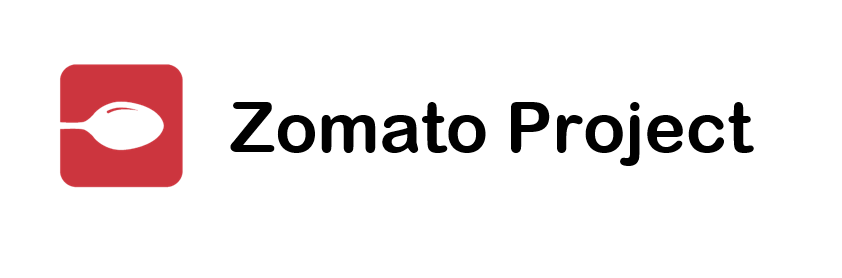

# Importing Library :-

In [1]:
import numpy as np                                  
import pandas as pd                              
import seaborn as sns                                 
import plotly.express as px                   
import plotly.graph_objs as go                       
import matplotlib.pyplot as plt                  
from matplotlib import colors as mcolors                   
from plotly.offline import iplot                       
import folium                                          
from folium.plugins import HeatMap                               
from geopy.geocoders import Nominatim                                 
from wordcloud import WordCloud                                  
import re                                      
from wordcloud import WordCloud, STOPWORDS                              
from PIL import Image                                     


Original_data = pd.read_csv(r'C:\Users\Sabae\OneDrive\Desktop\zomato.csv')     # Loading Data With The Help of Pandas.
Original_data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


# Cleaning & Visualization the Data :-

In [2]:
d1 = pd.read_csv(r'C:\Users\Sabae\OneDrive\Desktop\zomato.csv')  # Coping Zomato Dataset Into One Variable for Doing Some Operations.
d1.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [3]:
pd.isnull(d1).sum()  # TO Checking Data is There Any Null Values Or Not.

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

### Droping Some Columns Which is Not in Use

In [4]:
d1 = d1.drop(['address','phone','listed_in(city)','dish_liked','menu_item'], axis=1)      # Droping Some Column Using Drop Function.
d1.head()    # Checking Only Top Data Using head.

,url,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),reviews_list,listed_in(type)
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


In [5]:
d1.info()        # Checking All Data Type.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   name                         51717 non-null  object
 2   online_order                 51717 non-null  object
 3   book_table                   51717 non-null  object
 4   rate                         43942 non-null  object
 5   votes                        51717 non-null  int64 
 6   location                     51696 non-null  object
 7   rest_type                    51490 non-null  object
 8   cuisines                     51672 non-null  object
 9   approx_cost(for two people)  51371 non-null  object
 10  reviews_list                 51717 non-null  object
 11  listed_in(type)              51717 non-null  object
dtypes: int64(1), object(11)
memory usage: 4.7+ MB


### Droping Duplicates Values From Zomato Dataset

In [6]:
d1.drop_duplicates(inplace= True)        # Droping Dublicate Values using drop_duplicates Function.
d1.shape                

(51717, 12)

### Cleaning Rate Columns

In [7]:
d1['rate'].unique()    # Cleaning Rate Column Using Unique Function.

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [8]:
def Cleaning_rate(cl_rate):               # Creating Function to Clean Rate Column.
    if(cl_rate == 'NEW' or cl_rate == '-'):               # Removing 'NEW','-' & '/5'
        return np.nan                                         # Return Output.
    else:
        return float(str(cl_rate).split('/')[0])              # Return Output.
        
d1['rate'] = d1['rate'].apply(Cleaning_rate)             # Applying Function to get Output.
d1['rate'].head()            # Checking Only Top Data Using head.

0    4.1
1    4.1
2    3.8
3    3.7
4    3.8
Name: rate, dtype: float64

### Filling Null Values in Rate Column

In [9]:
d1['rate'].fillna(d1['rate'].mean(), inplace= True)   # Filing Null Values Using Fillna Function.
d1['rate'].isnull().sum()             # TO Checking Data is There Any Null Values Or Not.

0

In [10]:
d1.info()       # Checking All Data Type.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51717 entries, 0 to 51716
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   url                          51717 non-null  object 
 1   name                         51717 non-null  object 
 2   online_order                 51717 non-null  object 
 3   book_table                   51717 non-null  object 
 4   rate                         51717 non-null  float64
 5   votes                        51717 non-null  int64  
 6   location                     51696 non-null  object 
 7   rest_type                    51490 non-null  object 
 8   cuisines                     51672 non-null  object 
 9   approx_cost(for two people)  51371 non-null  object 
 10  reviews_list                 51717 non-null  object 
 11  listed_in(type)              51717 non-null  object 
dtypes: float64(1), int64(1), object(10)
memory usage: 5.1+ MB


### Droping Null Values from dataset

In [11]:
d1.dropna(inplace= True)   # Droping Null Values Using Dropna Function.
d1.head()           

,url,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),reviews_list,listed_in(type)
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


In [12]:
pd.isnull(d1).sum()  # And Now there is no any null values in the data.

url                            0
name                           0
online_order                   0
book_table                     0
rate                           0
votes                          0
location                       0
rest_type                      0
cuisines                       0
approx_cost(for two people)    0
reviews_list                   0
listed_in(type)                0
dtype: int64

### Renameing the Columns

In [13]:
d1.rename(columns= {'name':'restaurant','approx_cost(for two people)':'cost_two_plates',
                    'listed_in(type)':'type'},inplace= True)     # Renaming the Columns Using Rename Function.
d1.head()           # Checking Only Top Data Using head.

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


### Cleaning Cost_two_plates Column

In [14]:
d1['cost_two_plates'].unique()                    # Checking Unique Values Using Unique Function.

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '50', '190', '1,700', '1,400', '180',
       '1,350', '2,200', '2,000', '1,800', '1,900', '330', '2,500',
       '2,100', '3,000', '2,800', '3,400', '40', '1,250', '3,500',
       '4,000', '2,400', '2,600', '120', '1,450', '469', '70', '3,200',
       '60', '560', '240', '360', '6,000', '1,050', '2,300', '4,100',
       '5,000', '3,700', '1,650', '2,700', '4,500', '140'], dtype=object)

In [15]:
d1['cost_two_plates'] = d1['cost_two_plates'].astype(str)                # Converting Object to String.
d1['cost_two_plates'] = d1['cost_two_plates'].apply(lambda i: i.replace(',',''))     # Cleaning Column Using Lambda Function.
d1['cost_two_plates'] = d1['cost_two_plates'].astype(float)             # Converting String to Float.
d1['cost_two_plates'].unique()          # Checking Unique Values Using Unique Function.

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700., 1400.,  180., 1350., 2200.,
       2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800., 3400.,
         40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,  469.,
         70., 3200.,   60.,  560.,  240.,  360., 6000., 1050., 2300.,
       4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [16]:
d1.info()                # Checking All Data Type.

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51148 entries, 0 to 51716
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              51148 non-null  object 
 1   restaurant       51148 non-null  object 
 2   online_order     51148 non-null  object 
 3   book_table       51148 non-null  object 
 4   rate             51148 non-null  float64
 5   votes            51148 non-null  int64  
 6   location         51148 non-null  object 
 7   rest_type        51148 non-null  object 
 8   cuisines         51148 non-null  object 
 9   cost_two_plates  51148 non-null  float64
 10  reviews_list     51148 non-null  object 
 11  type             51148 non-null  object 
dtypes: float64(2), int64(1), object(9)
memory usage: 5.1+ MB


# 1) Restaurant Wise Data Visualization

In [17]:
d1.groupby('location')['restaurant'].unique()            # Checking Unique Values Using Unique Function.

location
BTM                  [Sankranthi Veg Restaurant, Hearts Unlock Cafe...
Banashankari         [Jalsa, Spice Elephant, San Churro Cafe, Addhu...
Banaswadi            [Cafe Nibras, The Sanctuary, Crunch Pizzas, 9 ...
Bannerghatta Road    [Deja Vu Resto Bar, Fattoush, Empire Restauran...
Basavanagudi         [Grand Village, Timepass Dinner, Srinathji's C...
                                           ...                        
West Bangalore       [FreshMenu, Fit Dish Fetish, Garden City Mobil...
Whitefield           [Imperio Cafe, Night Diaries, LocalHost, AB's ...
Wilson Garden        [Tree Top, Sahana's (Nati Style), Karavali Kol...
Yelahanka            [Prashanth Naati Corner, Red Chillies Curries ...
Yeshwantpur          [Chef's Bank, New Agarwal Bhavan, Fishing Boat...
Name: restaurant, Length: 93, dtype: object

In [18]:
Restaurant = []                 # Creating Empty List.
Location = []                       # Creating Empty List.
for key,location in d1.groupby('location'):             # Using For Loop to Fetch all Data.
    Location.append(key)                                   # Taking All Data into empty list.
    Restaurant.append(len(location['restaurant'].unique()))      # Taking All Data into empty list.

In [19]:
Rst_total = pd.DataFrame(zip(Location,Restaurant))                # Unziping data.
Rst_total.columns = ['Location','Restaurant']                        # Creating Columns Name Using Column Function.
Rst_total.set_index('Location',inplace=True)                             # Set data Using Set_index Function.
Rst = Rst_total.sort_values(by='Restaurant').tail(10)            # Checking Only Last Data Using tail.     
Rst          # Calling data Using Rst.

,Restaurant
Location,
Bellandur,346
Jayanagar,351
Bannerghatta Road,445
JP Nagar,498
Indiranagar,520
Marathahalli,651
HSR,678
Electronic City,691
BTM,695


In [20]:
fig = go.Bar(x = Rst_total['Restaurant'].nlargest(10).index,             # Ploting Bar Graph For Better Visalization.
               y = Rst_total['Restaurant'].nlargest(10),
               marker_line_color='black',marker_line_width=2)

iplot([fig])

##### This Graph Shows Whitefield and BTM has the Maximum number of Restaurant

### Cheapest Restaurant in Bangalore

In [21]:
d1['cost_two_plates'].min()           # Using Min to Check Cheapest Price of Restaurant.

40.0

In [22]:
d1[d1['cost_two_plates'] == 40]['restaurant']   # Cheapest Restaurant in Bangalore.

5270     Srinidhi Sagar Food Line
12232    Srinidhi Sagar Food Line
14819    Srinidhi Sagar Food Line
17773              Srinidhi Sagar
18891    Srinidhi Sagar Food Line
27091       Srinidhi Sagar Deluxe
29785       Srinidhi Sagar Deluxe
32485              Srinidhi Sagar
Name: restaurant, dtype: object

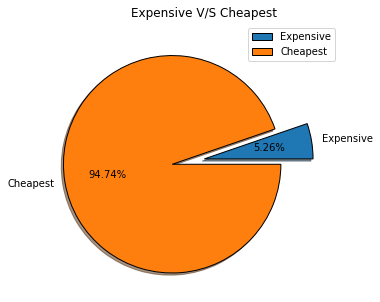

In [23]:
plt.figure(figsize= (5,5))           # Using Figure to Fig the Size.
plt.xticks(fontsize=10)                            # Using Xticks to Give Font Size.
Resta_no = np.array([5,90])                              # Using Numpy as np.
plt.title('Expensive V/S Cheapest')           # Giving title to Figure.
Resta_name = ['Expensive','Cheapest']                    # Giving name.
my_explode = [0,0.3]                     # Giving Explode.
plt.pie(Resta_no,labels=Resta_name,shadow=True,autopct='%1.2f%%',explode=my_explode,
        wedgeprops={'edgecolor':'k'})                  # Ploting Pie Chart for Visualization.
plt.legend(['Expensive','Cheapest'])            # Giving Legend.
plt.show()              # Showing the pie chart.

### Expensive Restaurant in Bangalore

In [24]:
d1['cost_two_plates'].max()           # Using Max to Check Cheapest Price of Restaurant.

6000.0

In [25]:
d1[d1['cost_two_plates'] == 6000]['restaurant']   # Expensive Restaurant in Bangalore.

19139    Le Cirque Signature - The Leela Palace
45618    Le Cirque Signature - The Leela Palace
Name: restaurant, dtype: object

### Cost-effective Restaurant in Bangalore

In [26]:
d1['cost_two_plates'].mean()       # Using Mean to Check affordable Restaurant.

556.0437358254477

In [27]:
R1 = d1[d1['cost_two_plates'] <= 556].loc[:,('cost_two_plates','restaurant')].head(18)  # Affordadble Restaurant in Bangalore.
R2 = R1.sort_values('cost_two_plates')             # Sort the Values Using Sort Function.
R3 = R2.drop([10],axis=0)
R3              #  Calling Data Using R3.

,cost_two_plates,restaurant
26,200.0,Coffee Tindi
3,300.0,Addhuri Udupi Bhojana
24,300.0,Hide Out Cafe
18,300.0,T3H Cafe
20,400.0,The Vintage Cafe
19,400.0,360 Atoms Restaurant And Cafe
36,400.0,Fast And Fresh
13,450.0,Caf-Eleven
12,500.0,The Coffee Shack
34,500.0,Faasos


Text(0.5, 1.0, 'Affordadble Restaurant in Bangalore')

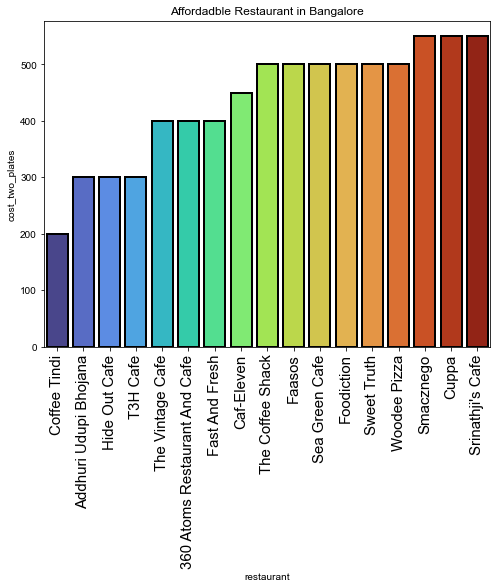

In [28]:
fig = plt.figure(figsize=(8,6))          # Using Figure to Fig the Size.
plt.xticks(rotation = 90,fontsize=15)           # Using Xticks to Give Font Size and Rotaion.
sns.set_style(style='whitegrid')            # Affordadble Restaurant in Bangalore.
sns.barplot(data=R3,x='restaurant',y='cost_two_plates',palette='turbo',
            edgecolor='black',linewidth=2)    # Ploting Barplot.
plt.title('Affordadble Restaurant in Bangalore')   # Giving Title to Figure.

##### This all Restaurant are affordable in Bngalore

### Top 10 Best Budget Restaurant in Bangalore Location Wise

In [29]:
R4 = d1[(d1['cost_two_plates'] <= 670) & (d1['location'] == 'BTM') &
                  (d1['rate'] >4) & 
                  (d1['rest_type'] == 'Quick Bites')].head(50)  # Creating Condition & Checking Only Top Data Using head.   
R4['restaurant'].unique()    # Checking Unique Values Using Unique Function.

array(['Swadista Aahar', 'Litti Twist', 'The Shawarma Shop', 'Gorbandh',
       'Yum In My Tum', 'Chaatimes', "Muthashy's", 'Swad Punjab Da',
       'Hungry Lee', "Domino's Pizza", 'Roti Wala'], dtype=object)

### Highest Voted Restaurant in Bangalore

In [30]:
R5 = d1.groupby(['restaurant']).sum()      # Grouping the Data Using Group By.
R6 = R5.sort_values('votes',ascending=False)   # Restaurant Wise Highest Votes.
R7 = R6[['votes']].head(10)         # Checking Only Top Data Using head.
R7   # Calling Dtaa using R7.

,votes
restaurant,
Onesta,347520
Truffles,301059
Empire Restaurant,229808
Hammered,180602
The Black Pearl,172122
Meghana Foods,129557
Barbeque Nation,108425
Smally's Resto Cafe,102877
Byg Brewski Brewing Company,99531


Text(0.5, 1.0, 'Highest Voted Restaurant')

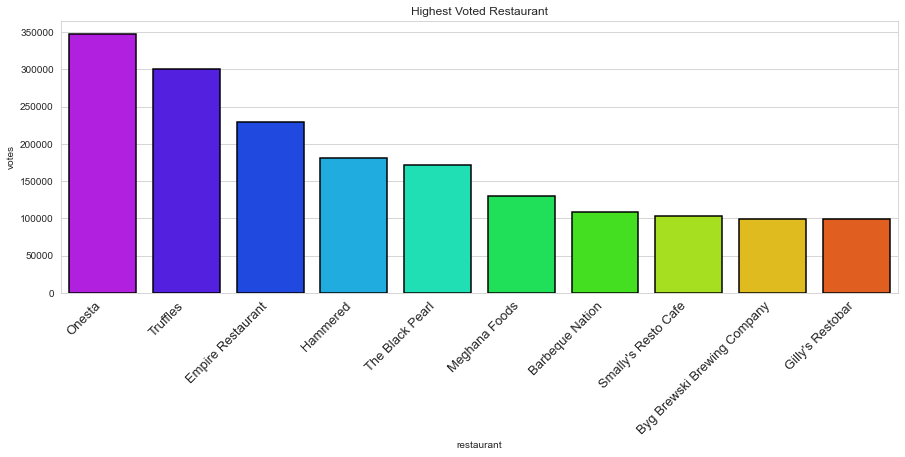

In [31]:
fig = plt.figure(figsize=(15,5))     # Using Figure to Fig the Size.
sns.set_style(style='whitegrid')            # Highest Voted Restaurant.
sns.barplot(data=R7.reset_index(),x='restaurant',y='votes',palette='gist_rainbow_r',
            edgecolor='black',linewidth=1.5)   # Ploting barplot.
plt.xticks(rotation=45,horizontalalignment='right',fontsize=13)      # Using Xticks to Give Font Size and Rotaion.
plt.title('Highest Voted Restaurant')               # Giving Title to Figure.

##### 4 star Resturant under 500Rs

In [32]:
R8 = d1[(d1['rate'] >= 4) & (d1['cost_two_plates'] <= 556)]      # Creating Condition.
R9 = R8.drop([10],axis=0)
R10 = R9[['restaurant','rate','cost_two_plates']]
R10

,restaurant,rate,cost_two_plates
9,Smacznego,4.2,550.0
12,The Coffee Shack,4.2,500.0
13,Caf-Eleven,4.0,450.0
34,Faasos,4.2,500.0
39,Maruthi Davangere Benne Dosa,4.0,150.0
...,...,...,...
51329,Pita Pit,4.0,500.0
51334,Faasos,4.0,500.0
51345,The Wok Shop,4.2,500.0
51376,nu.tree,4.2,400.0


### Most Popular Outlets in Bangalore

Text(0.5, 0, 'Number of Counts')

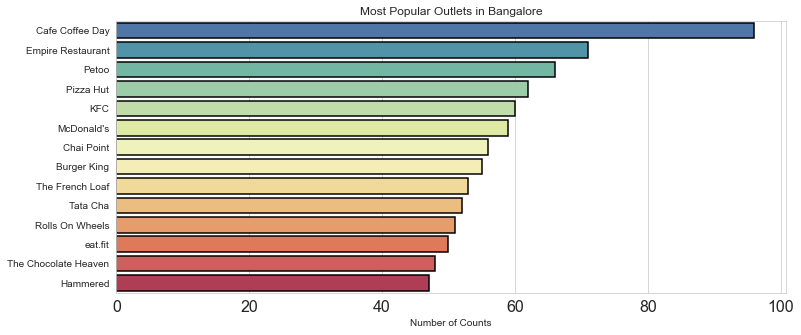

In [33]:
plt.figure(figsize= (12,5))                          # Ploting Barplot.
plt.xticks(fontsize=16)
R8 = d1['restaurant'].value_counts()[0:40:3]
sns.barplot(x=R8,y=R8.index,palette='Spectral_r',edgecolor='black',linewidth=1.5)
plt.title('Most Popular Outlets in Bangalore')
plt.xlabel('Number of Counts')

### Geographical Visualization on Restaurant 

In [163]:
locations = pd.DataFrame({'Name':d1['location'].unique()})              # Creating Latitude & Longitude.

locations['New_Name'] = 'Bangalore' + locations['Name']

lat_lon = []   # list that will store tha lat and lon.
geolocator = Nominatim(user_agent = 'app')    # to establish Connection
for location in locations['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)   # if no location is there
    else:
        geo = (location.latitude,location.longitude)
        lat_lon.append(geo)
        
locations['geo_loc'] = lat_lon

Rest_location = pd.DataFrame(d1['location'].value_counts().reset_index())  # this is used to plot maps.
Rest_location.columns=['Name','Count']

Restaurant_locations = Rest_location.merge(locations,on='Name',how='left').dropna()

def GeneratBaseMap(default_location = [12.93,77.61], default_zoom_start = 12):
    BaseMap = folium.Map(location = default_location,zoom_start = default_zoom_start)
    return BaseMap
np.array(Restaurant_locations['geo_loc'] )

lat,lon = zip(*np.array(Restaurant_locations['geo_loc'])) # unziping it.


Restaurant_locations['lat'] = lat
Restaurant_locations['lon'] = lon
Restaurant_locations.head()

,Name,Count,New_Name,geo_loc,lat,lon
0,BTM,5071,BangaloreBTM,"(45.95485055, -112.49659530324134)",45.954851,-112.496595
1,HSR,2496,BangaloreHSR,"(18.1475, 41.538889)",18.147500,41.538889
2,Koramangala 5th Block,2481,BangaloreKoramangala 5th Block,"(12.9348429, 77.6189768)",12.934843,77.618977
3,JP Nagar,2219,BangaloreJP Nagar,"(12.2655944, 76.6465404)",12.265594,76.646540
4,Whitefield,2109,BangaloreWhitefield,"(53.5533682, -2.2969019)",53.553368,-2.296902


In [164]:
BaseMap = GeneratBaseMap()                         # This the Base Map in Bangalore.
BaseMap

In [165]:
Restaurant_locations[['lat','lon','Count']].values.tolist()   # To Count How Many Resturant are there.

HeatMap(Restaurant_locations[['lat','lon','Count']].values.tolist(),zoom=20,radius=15).add_to(BaseMap)
BaseMap     # Creating a HeatMap.

##### it is clear that restuarant tend to concentrate in central bangalore area.

##### it can conclude that  entrepreneurs can refer this and find out good locations for their Satrtup/venture.

##### Note: HeatMap help to visualize data in a better and understanding way which have lattitude,longitude or importance of  particular place.

### Heat Map of North Indian Restaurant.

In [150]:
d1_ = d1[d1['cuisines'] == 'North Indian']                                      # Heat Map of North Indian Restaurant.
North_indian = d1_.groupby(['location'],as_index = False)['url'].agg('count')
North_indian.columns = ['Name','Count']
North_indian = North_indian.merge(locations,on='Name',how='left').dropna()
North_indian['lan'],North_indian['lon']=zip(*North_indian['geo_loc'].values)
North_indian.drop(['geo_loc'],axis=1)
North_indian.head()

,Name,Count,New_Name,geo_loc,lan,lon
0,BTM,328,BangaloreBTM,"(45.95485055, -112.49659530324134)",45.954851,-112.496595
1,Banashankari,36,BangaloreBanashankari,"(15.8876779, 75.7046777)",15.887678,75.704678
2,Banaswadi,8,BangaloreBanaswadi,"(13.0141618, 77.6518539)",13.014162,77.651854
3,Bannerghatta Road,75,BangaloreBannerghatta Road,"(12.8545439, 77.5886892)",12.854544,77.588689
4,Basavanagudi,21,BangaloreBasavanagudi,"(12.9417261, 77.5755021)",12.941726,77.575502


In [166]:
BaseMap = GeneratBaseMap()                         # This the Base Map of North Indian Restaurant.
HeatMap(North_indian[['lan','lon','Count']].values.tolist(),zoom=20,radius=15).add_to(BaseMap)
BaseMap

### Heat Map of South Indian Restaurant.

In [39]:
d1_ = d1[d1['cuisines'] == 'South Indian']                                 # Heat Map of South Indian Restaurant.
South_indian = d1_.groupby(['location'],as_index = False)['url'].agg('count')
South_indian.columns = ['Name','Count']
South_indian = South_indian.merge(locations,on='Name',how='left').dropna()
South_indian['lan'],South_indian['lon']=zip(*South_indian['geo_loc'].values)
South_indian = South_indian.drop(['geo_loc'],axis=1)
South_indian.head()

,Name,Count,New_Name,lan,lon
0,BTM,113,BangaloreBTM,45.954851,-112.496595
1,Banashankari,86,BangaloreBanashankari,15.887678,75.704678
2,Banaswadi,37,BangaloreBanaswadi,13.014162,77.651854
3,Bannerghatta Road,48,BangaloreBannerghatta Road,12.854544,77.588689
4,Basavanagudi,89,BangaloreBasavanagudi,12.941726,77.575502


In [167]:
BaseMap = GeneratBaseMap()                         # This the Base Map of North Indian Restaurant.
HeatMap(South_indian[['lan','lon','Count']].values.tolist(),zoom=20,radius=15).add_to(BaseMap)
BaseMap

# 2) Data Visualization Based on Type of Order placed:

In [41]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


# Online Order:

### Max and Min Onlne Order Facility 

In [42]:
O_r1 = d1['online_order'].value_counts(ascending = False)   # This Indicates Online_order Facility.
O_r1

Yes    30311
No     20837
Name: online_order, dtype: int64

C:\Users\Sabae\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'This Graph Indicates Online Order Facility Only')

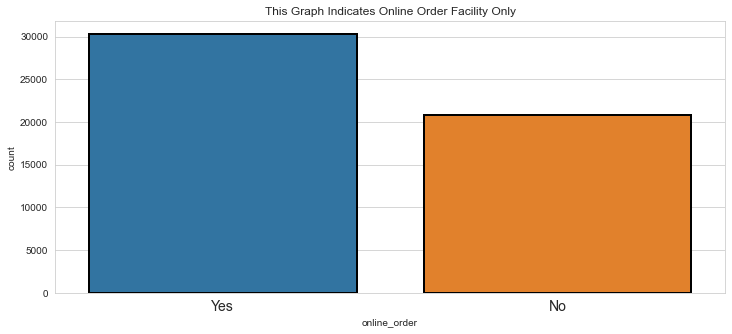

In [43]:
plt.figure(figsize= (12,5))                             # This Graph Showing Online_order Facility.
plt.xticks(fontsize=14)
sns.countplot(d1['online_order'],edgecolor='black',linewidth=2)
plt.title('This Graph Indicates Online Order Facility Only')

### Finding In Which Restaurant Online Order Facility is Avilable or Not

In [44]:
O_r2 = d1.groupby(['restaurant','online_order'])['restaurant'].count()   # In Which Restaurant Online Order Facility Avilable.
O_r2.to_csv('restaurant_online.csv')
O_r2 = pd.read_csv('restaurant_online.csv')
O_r2 = pd.pivot_table(O_r2,values = None,index = ['restaurant'], columns = ['online_order'],
                      fill_value=0,aggfunc=np.sum)[8:50:3]
O_r2

restaurant.1    
online_order                                No Yes
restaurant                                        
11 to 11 Express Biriyanis                   0   2
1441 Pizzeria                                0   6
1722 Urban Bistro                            0  11
1980s Games Cafe                             0   5
1TO3 Kitchen                                 1   0
20 Feet High                                 0  19
22S                                          0   1
24 Hours Coffee Drop - La Classic            2   0
24@43 - The Oterra                           2   0
2nd Home Restaurant                          0  11
30 Square                                    0  11
37 China Town                                2   0
3G's - Gulp & Groove                         0   8
4 Mangoes                                    2   0

In [45]:
O_r3 = ['11 to 11 Express Biriyanis','1441 Pizzeria','1722 Urban Bistro','1980s Games Cafe','1TO3 Kitchen','20 Feet High','22S','24 Hours Coffee Drop - La Classic','24@43 - The Oterra','2nd Home Restaurant','30 Square','37 China Town','3Gs - Gulp & Groove','4 Mangoes']
y1 = [0,0,0,0,1,0,0,2,2,0,0,2,0,2]
y2 = [2,6,11,5,0,19,1,0,0,11,11,0,8,0]

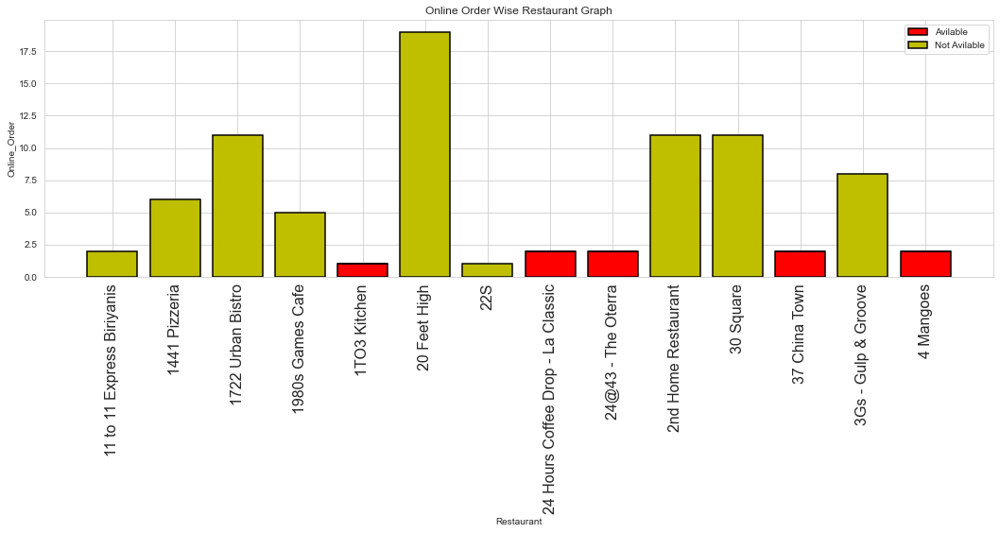

In [46]:
plt.figure(figsize= (18,5))                 # In Which Restaurant Online Order Facility is Avilable or Not.
plt.xticks(rotation=90,fontsize=16)
plt.title('Online Order Wise Restaurant Graph')
plt.xlabel('Restaurant')
plt.ylabel('Online_Order')
plt.bar(O_r3,y1,color='r',edgecolor='black',linewidth=1.5)
plt.bar(O_r3,y2,bottom=y1,color='y',edgecolor='black',linewidth=1.5)
plt.legend(['Avilable','Not Avilable'])
plt.show()

### Finding How Many Rating a resturant is Getting When Online Order is avilable

In [47]:
O_r4 = d1.groupby('rate').count()
O_r5 = O_r4[['online_order']]
O_r5[0:7:4]

,online_order
rate,
1.8,5
2.3,51
2.7,303
3.1,1550
3.5,2764
3.8,3819
4.2,2155
4.6,300


In [48]:
Online_order = ['5','51','303','1550','2764','3819','2155','300']
Rating = [1.8,2.3,2.7,3.1,3.5,3.8,4.2,4.6]

Text(0, 0.5, 'Online Order')

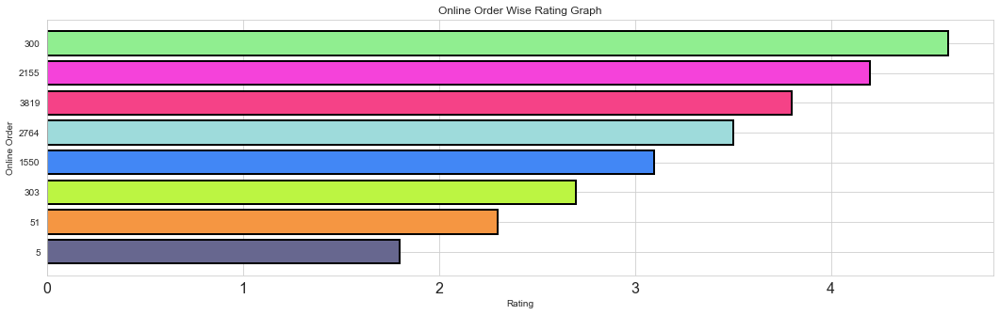

In [49]:
plt.figure(figsize= (18,5))                 # Online Order Wise Rating Data.
plt.xticks(rotation=0,fontsize=16)
plt.title('Online Order Wise Rating Graph')
plt.barh(Online_order,Rating,edgecolor='black',linewidth=2,color=['#67678f', '#f59642', '#bcf542', '#4287f5', '#9edbdb','#f54287','#f542da','lightgreen'])
plt.xlabel('Rating')
plt.ylabel('Online Order')

# 3) Data Visualization on Table Booking:

In [50]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


### Maximum and Minimmum Booked Table   

In [51]:
B_t1 = d1['book_table'].value_counts(ascending = False)   # This Indicates Book_Table Facility. 
B_t1

No     44699
Yes     6449
Name: book_table, dtype: int64

C:\Users\Sabae\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'This Graph Indicates Book Table Facility Only')

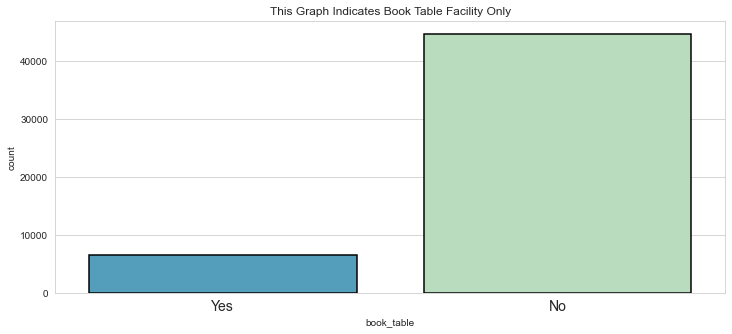

In [52]:
plt.figure(figsize= (12,5))                             
plt.xticks(fontsize=14)                             # This Graph Showing Book_Table Facility.
ax = sns.countplot(d1['book_table'],edgecolor='black',palette='GnBu_r',linewidth=1.5)
plt.title('This Graph Indicates Book Table Facility Only')

### Finding In Which Restaurant have option to Book Table 

In [53]:
B_t2 = d1.groupby(['restaurant','book_table'])['restaurant'].count()   # In Which Restaurant Online Order Facility Avilable.
B_t2.to_csv('restaurant_online.csv')
B_t2 = pd.read_csv('restaurant_online.csv')
B_t2 = pd.pivot_table(B_t2,values = None,index = ['restaurant'], columns = ['book_table'],
                      fill_value=0,aggfunc=np.sum)[3:50:4]
B_t2

restaurant.1    
book_table                                     No Yes
restaurant                                           
#refuel                                         3   0
100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C            3   0
1441 Pizzeria                                   6   0
18+ Ice Cafe                                    6   0
1Q1                                             0  16
20 Feet High                                    0  19
24 Carats - The Capitol                        12   0
24/7 Food Service                               4   0
2nd Home Restaurant                            11   0
360 Atoms Restaurant And Cafe                   7   0
3B's - Buddies, Bar & Barbecues                 0  17
4 Mangoes                                       2   0

In [54]:
B_t3 = ['#refuel','ÃÂÃÂ°C','1441 Pizzeria','18+ Ice Cafe','1Q1','20 Feet High','24 Carats - The Capitol','24/7 Food Service','2nd Home Restaurant','360 Atoms Restaurant And Cafe','3Bs - Buddies, Bar & Barbecues','4 Mangoes']
x1 = [3,3,6,6,0,0,12,4,11,7,0,2]
x2 = [5,0,10,0,16,19,0,8,0,0,17,0]

In [55]:
len(x2)

12

C:\Users\Sabae\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 131 (\x83) missing from current font.

C:\Users\Sabae\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 130 (\x82) missing from current font.



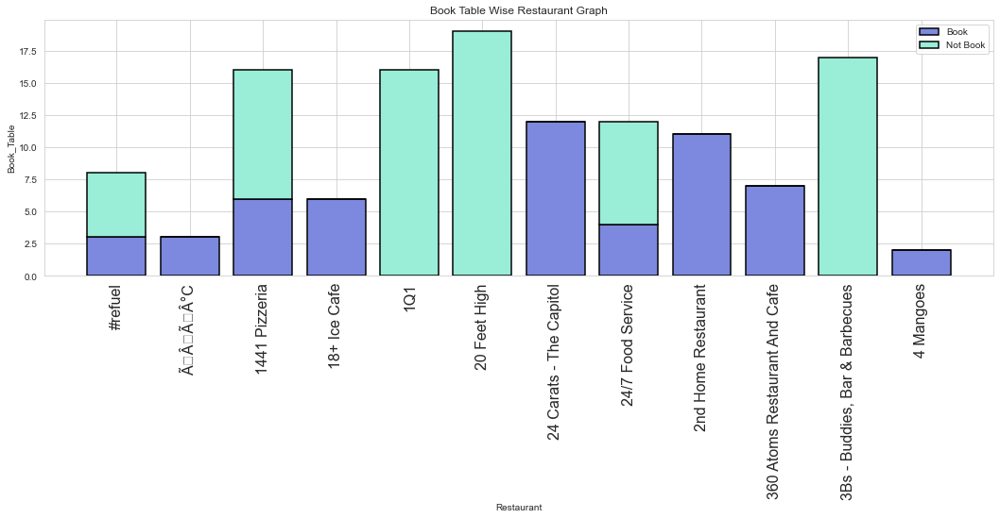

In [168]:
plt.figure(figsize= (18,5))                 # In Which Restaurant Book Table or Not.
plt.xticks(rotation=90,fontsize=16)
plt.title('Book Table Wise Restaurant Graph')
plt.xlabel('Restaurant')
plt.ylabel('Book_Table')
plt.bar(B_t3,x1,color='#7c89de',edgecolor='black',linewidth=1.5)
plt.bar(B_t3,x2,bottom=x1,color='#9aedd7',edgecolor='black',linewidth=1.5)
plt.legend(['Book','Not Book'])
plt.show()

### Finding How Much Rating get When Customer Book Table in Restaurant

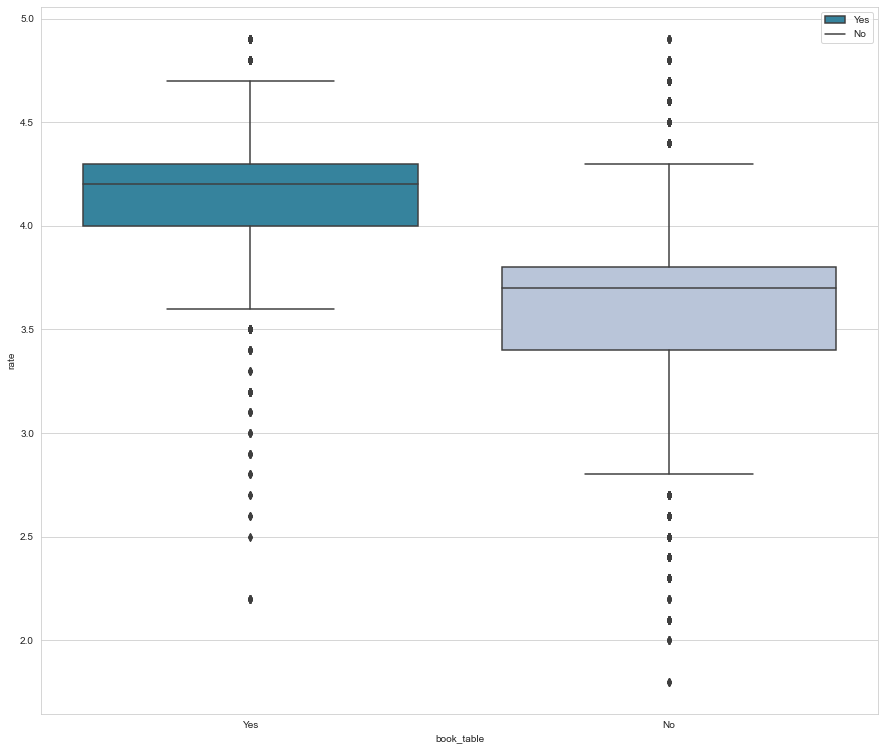

In [57]:
plt.figure(figsize= (15,13))
sns.boxplot(data=d1,x='book_table',y='rate',palette='PuBuGn_r') 
plt.legend(['Yes','No'])

# 4) Rate Wise Data Visualization

In [58]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


In [59]:
d1[['rate','cost_two_plates','online_order']]

,rate,cost_two_plates,online_order
0,4.100000,800.0,Yes
1,4.100000,800.0,Yes
2,3.800000,800.0,Yes
3,3.700000,300.0,No
4,3.800000,600.0,No
...,...,...,...
51712,3.600000,1500.0,No
51713,3.700449,600.0,No
51714,3.700449,2000.0,No
51715,4.300000,2500.0,No


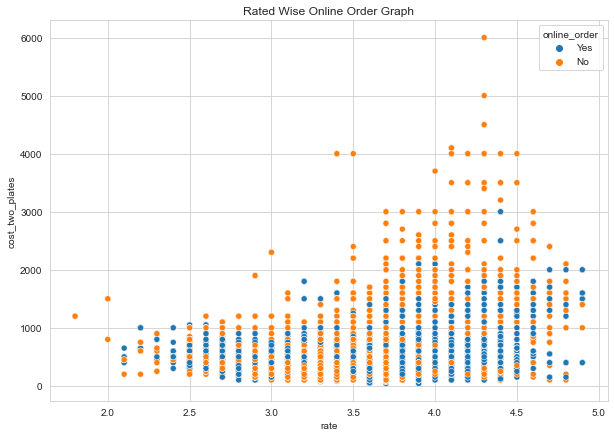

In [60]:
plt.figure(figsize= (10,7))                          # Ploting Scatter plot.
plt.title('Rated Wise Online Order Graph')
sns.scatterplot(x='rate',y='cost_two_plates',hue='online_order',data=d1)
plt.show()

##### From This Scatterplot We can Observe that most of the highest rated accepts online order and they are in budget too

In [61]:
d1['rate'].value_counts().head(10)

3.700449    9885
3.900000    3958
3.800000    3819
3.700000    3808
3.600000    3287
4.000000    3145
4.100000    2928
3.500000    2764
3.400000    2447
3.300000    2277
Name: rate, dtype: int64

In [62]:
fig = px.histogram(x='rate',data_frame=d1)                       # Ploting histogram graph.
fig.update_traces(marker_line_width=2,marker_line_color='black')

##### Conclusion : Almost more than 50 percent of restaurants has rating between 3 and 4 . In the rare Seniorio Where Reastaurants having 4.5 rating

### Finding How Much Rating Get When Customer Booked Table in Restaurant

In [63]:
Rate1 = d1.groupby(['rate','book_table'])['rate'].count()   # Rating Wise Book Table.
Rate1.to_csv('rate_online.csv')
Rate1 = pd.read_csv('rate_online.csv')
Rate1 = pd.pivot_table(Rate1,values = None,index = ['rate'], columns = ['book_table'],
                      fill_value=0,aggfunc=np.sum)[1:45:3]
Rate1

rate.1     
book_table     No  Yes
rate                  
1.8             5    0
2.2            13   13
2.5            98    2
2.8           574    6
3.1          1540   10
3.4          2431   16
3.7          3590  218
3.9          3401  557
4.2          1204  951
4.5           233  423
4.8            23   43

In [64]:
Rate2 = ['1.8','2.2','2.5','2.8','3.1','3.4','3.7','3.9','4.2','4.5','4.8']
Y1 = [5,13,98,574,1540,2431,3590,3401,1204,233,23]
N2 = [0,13,2,6,10,16,218,557,951,423,43]

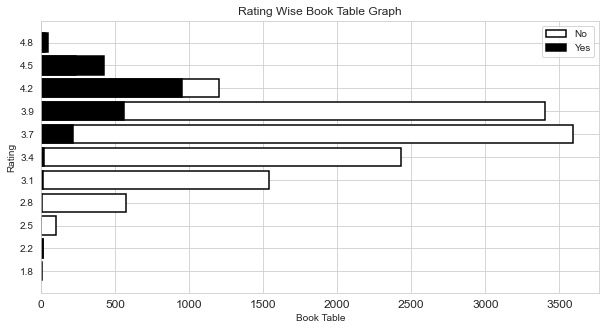

In [65]:
plt.figure(figsize= (10,5))                 # Online Order Wise Rating Data.
plt.xticks(rotation=0,fontsize=12)
plt.title('Rating Wise Book Table Graph')
plt.xlabel('Book Table')
plt.ylabel('Rating')
plt.barh(Rate2,Y1,color='w',edgecolor='black',linewidth=1.5)
plt.barh(Rate2,N2,color='k',edgecolor='black',linewidth=1.5)
plt.legend(['No','Yes'])
plt.show()

# 5) Location Wise Data Visualization

In [66]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


### FInding Location Wise Restaurant

In [67]:
Restaurant = []
Location = []
for key,location in d1.groupby('location'):
    Location.append(key)
    Restaurant.append(len(location['restaurant'].unique()))

In [68]:
Location1 = pd.DataFrame(zip(Location,Restaurant))                       #  Location Wise Data Extract.
Location1.columns = ['Location','Restaurant']
Location1.set_index('Location',inplace=True)
Loc = Location1.sort_values(by='Restaurant',ascending= False)[1:30:3]
Loc

,Restaurant
Location,
BTM,695
Marathahalli,651
Bannerghatta Road,445
Sarjapur Road,321
Koramangala 5th Block,263
Rajajinagar,226
Frazer Town,188
Koramangala 1st Block,166
Old Airport Road,135


In [69]:
colors = ['gold', 'mediumturquoise', 'darkorange', 'lightgreen','dark','lightblack','lightblue','darkyellow','light','lightdeep']

fig = go.Figure(data=[go.Pie(labels=['BTM','Marathahalli','Bannerghatta Road','Sarjapur Road','Koramangala 5th Block','Rajajinagar','Frazer Town','Koramangala 1st Block','Old Airport Road','Ulsoor'],
                             values=[695,651,445,321,263,226,188,166,135,117])])
fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#000000', width=1.5)))
fig.update_layout(
       title='Locatio Wise Restaurant Pie Chart',
       legend_title='Location')
fig.show()

### Most Famous Foodies Location in Bangalore

In [70]:
Loc1 = d1['location'].value_counts().rename_axis('Location').reset_index(name='Resturant')[:20]   # Most Famous Foodies area in Bangalore.
Loc1

,Location,Resturant
0,BTM,5071
1,HSR,2496
2,Koramangala 5th Block,2481
3,JP Nagar,2219
4,Whitefield,2109
5,Indiranagar,2033
6,Jayanagar,1916
7,Marathahalli,1808
8,Bannerghatta Road,1611
9,Bellandur,1271


Text(0.5, 1.0, 'Most Famous Foodies Location in Bangalore')

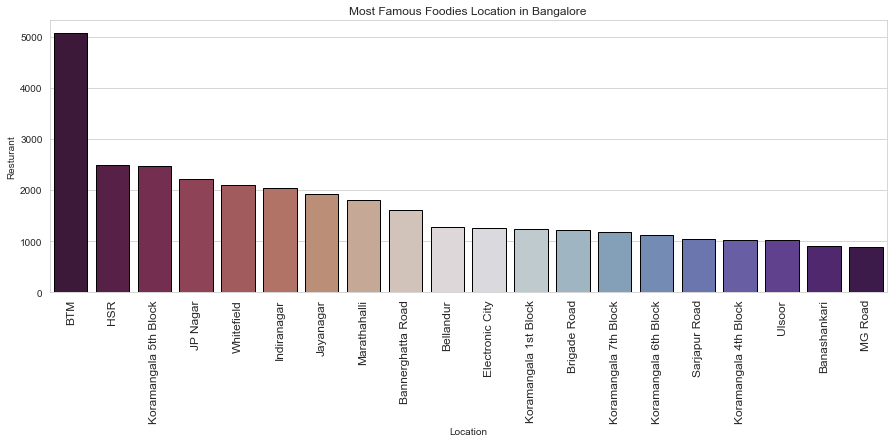

In [71]:
fig = plt.figure(figsize=(15,5))               # ploting Barplot.
plt.xticks(rotation=90,fontsize=12)
sns.set_style(style='whitegrid')            
sns.barplot(data=Loc1,x='Location',y='Resturant',palette='twilight_shifted_r',edgecolor='black')
plt.title('Most Famous Foodies Location in Bangalore')

### Location Wise Restaurant Name

In [72]:
Loc2 = d1.groupby('location')['restaurant'].unique().rename_axis('Location').reset_index(name='Restaurant Name')
Loc2

,Location,Restaurant Name
0,BTM,"[Sankranthi Veg Restaurant, Hearts Unlock Cafe..."
1,Banashankari,"[Jalsa, Spice Elephant, San Churro Cafe, Addhu..."
2,Banaswadi,"[Cafe Nibras, The Sanctuary, Crunch Pizzas, 9 ..."
3,Bannerghatta Road,"[Deja Vu Resto Bar, Fattoush, Empire Restauran..."
4,Basavanagudi,"[Grand Village, Timepass Dinner, Srinathji's C..."
...,...,...
88,West Bangalore,"[FreshMenu, Fit Dish Fetish, Garden City Mobil..."
89,Whitefield,"[Imperio Cafe, Night Diaries, LocalHost, AB's ..."
90,Wilson Garden,"[Tree Top, Sahana's (Nati Style), Karavali Kol..."
91,Yelahanka,"[Prashanth Naati Corner, Red Chillies Curries ..."


### Finding Which is the Best Location For Opening New Restaurant

In [73]:
Loc3 = d1['location'].value_counts(ascending = False).rename_axis('Location').reset_index(name='Resturant').head(10)
Loc3                                      # Max Restaurant Location.

,Location,Resturant
0,BTM,5071
1,HSR,2496
2,Koramangala 5th Block,2481
3,JP Nagar,2219
4,Whitefield,2109
5,Indiranagar,2033
6,Jayanagar,1916
7,Marathahalli,1808
8,Bannerghatta Road,1611
9,Bellandur,1271


In [74]:
X_data = ['BTM','HSR','Koramangala 5th Block','JP Nagar','Whitefield','Indiranagar','Jayanagar','Marathahalli','Bannerghatta Road','Others']

Y_data = [5071,4962,2496,2481,2219,2109,2033,1916,1808,1611]

In [75]:
x_data = ['St. Marks Road','Commercial Street','Ejipura','Old Airport Road','Domlur','Cunningham Road','Shivajinagar','Shanti Nagar','Lavelle Road','Church Street']

y_data = [904,894,841,804,724,720,684,674,656,645]

Text(0.5, 1.0, 'Location Wise Min Restaurant')

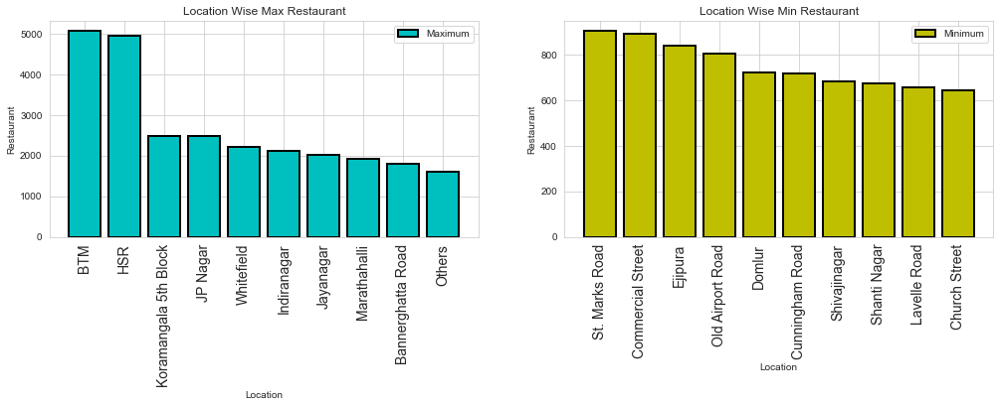

In [76]:
fig = plt.figure(figsize=(17,4))
plt.subplot(1,2,1)
plt.bar(X_data,Y_data,color='c',edgecolor='black',linewidth=2)
plt.xlabel('Location')
plt.ylabel('Restaurant')
plt.legend(['Maximum'])
plt.xticks(rotation=90,fontsize=14)
plt.title('Location Wise Max Restaurant')
plt.subplot(1,2,2)
plt.bar(x_data,y_data,color='y',edgecolor='black',linewidth=2)
plt.xlabel('Location')
plt.ylabel('Restaurant')
plt.legend(['Minimum'])
plt.xticks(rotation=90,fontsize=14)
plt.title('Location Wise Min Restaurant')

##### This can be concluded from the above research that if someone wasnts to open a resturaunt, he may prefer to open the in the location where there is less no. of competitors to compete.

In [77]:
Loc4 = d1['location'].value_counts(ascending = True).rename_axis('Location').reset_index(name='Resturant').head(10)
Loc4                                          # Min Restaurant Location.

,Location,Resturant
0,Peenya,1
1,Rajarajeshwari Nagar,2
2,Jakkur,3
3,Yelahanka,5
4,West Bangalore,6
5,Central Bangalore,8
6,Nagarbhavi,9
7,Kengeri,9
8,Hebbal,14
9,North Bangalore,14


### Finding In Which Location Online Order Facility is Available

In [78]:
Loc5 = d1.groupby(['location','online_order'])['restaurant'].count()   
Loc5.to_csv('location_online.csv')
Loc5 = pd.read_csv('location_online.csv')
Loc5 = pd.pivot_table(Loc5,values=None, index=['location'],
                      columns=['online_order'], fill_value=0, aggfunc=np.sum)
Loc5.head(10)

restaurant      
online_order               No   Yes
location                           
BTM                      1766  3305
Banashankari              397   507
Banaswadi                 302   343
Bannerghatta Road         687   924
Basavanagudi              243   441
Basaveshwara Nagar         87   100
Bellandur                 519   752
Bommanahalli              121   115
Brigade Road              553   665
Brookefield               239   417

In [79]:
Location = ['BTM','Banashankari','Banaswadi','Bannerghatta Road','Basavanagudi','Bellandur','Brigade Road','Brookefield','Church Street','Commercial Street']
No = [1766,397,302,687,243,519,553,239,226,228]
Yes = [3305,507,343,924,441,752,665,417,343,142]

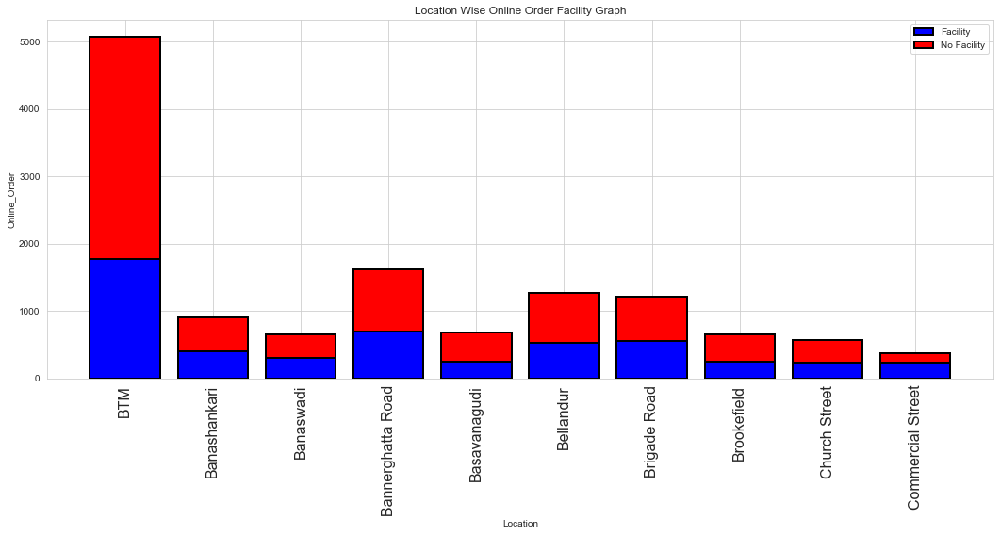

In [80]:
plt.figure(figsize= (18,7))                 # ploting Bar Plot.
plt.xticks(rotation=90,fontsize=16)
plt.title('Location Wise Online Order Facility Graph')
plt.bar(Location,No,color='b',edgecolor='black',linewidth=2)
plt.bar(Location,Yes,bottom=No,color='r',edgecolor='black',linewidth=2)
plt.xlabel('Location')
plt.ylabel('Online_Order')
plt.legend(['Facility','No Facility'])
plt.show()

##### As we now Bangalore is the high tech capital of india but there are some people who prefer to eat food at resturaunt arther than ordering online.

In [81]:
Loc6 = d1.groupby(['location','book_table'])['restaurant'].count()   # Book Table Wise Data Extract.
Loc6.to_csv('location_book.csv')
Loc6 = pd.read_csv('location_book.csv')
Loc6 = pd.pivot_table(Loc6,values=None, index=['location'], 
                      columns=['book_table'], fill_value=0,
                      aggfunc=np.sum)[10:70:3]
Loc6

restaurant     
book_table                    No  Yes
location                             
CV Raman Nagar                90    0
City Market                  120    2
Domlur                       427   55
Electronic City             1149   99
HSR                         2279  217
Hosur Road                    86   16
Infantry Road                117   34
Jalahalli                     38    0
KR Puram                      18    0
Kammanahalli                 591   49
Koramangala                   48    0
Koramangala 3rd Block        106  110
Koramangala 6th Block       1016  113
Kumaraswamy Layout           189    2
MG Road                      547  347
Malleshwaram                 635   89
Nagarbhavi                     9    0
North Bangalore               14    0
Peenya                         1    0
Rajajinagar                  550   41

In [82]:
LOCATION = ['Cunningham Road','Electronic City','Indiranagar','Kalyan Nagar','Koramangala 4th Block','Koramangala 7th Block','Malleshwaram','Old Airport Road','Residency Road','Shanti Nagar','Ulsoor']
NO = [316,1149,1579,692,695,1012,635,378,523,453,840]
YES = [175,99,454,149,322,164,89,59,151,58,177]

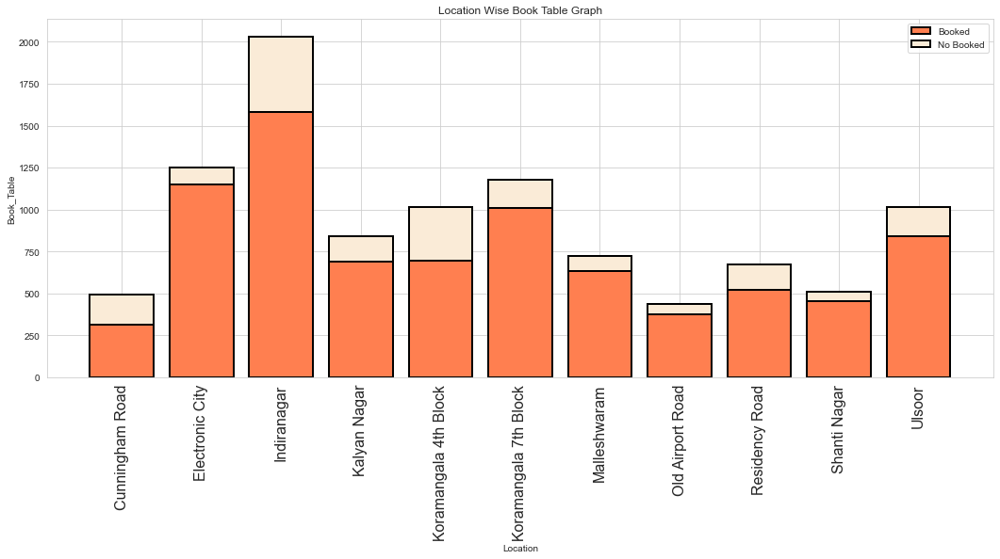

In [83]:
plt.figure(figsize= (18,7))                 # ploting Bar Plot.
plt.xticks(rotation=90,fontsize=16)
plt.title('Location Wise Book Table Graph')
plt.bar(LOCATION,NO,color='coral',edgecolor='black',linewidth=2)
plt.bar(LOCATION,YES,bottom=NO,color='antiquewhite',edgecolor='black',linewidth=2)
plt.xlabel('Location')
plt.ylabel('Book_Table')
plt.legend(['Booked','No Booked'])
plt.show()

##### we can attract customers to book table while giving discounts on visit.

### Location Wise Highest & Lowest Votes

In [84]:
Loc7 = d1.groupby(['location']).sum() 
Loc8 = Loc7.sort_values('votes',ascending=False)   # Location Wise Highest Votes.
Loc9 = Loc8[['votes']].head(10)
Loc9

,votes
location,
Koramangala 5th Block,2214827
Indiranagar,1172729
Koramangala 4th Block,685156
Church Street,594979
JP Nagar,586522
BTM,574058
Lavelle Road,505460
HSR,498772
Koramangala 7th Block,495289


C:\Users\Sabae\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'Koramangala 5th Block'),
  Text(1, 0, 'Indiranagar'),
  Text(2, 0, 'Koramangala 4th Block'),
  Text(3, 0, 'Church Street'),
  Text(4, 0, 'JP Nagar'),
  Text(5, 0, 'BTM'),
  Text(6, 0, 'Lavelle Road'),
  Text(7, 0, 'HSR'),
  Text(8, 0, 'Koramangala 7th Block'),
  Text(9, 0, 'Jayanagar')])

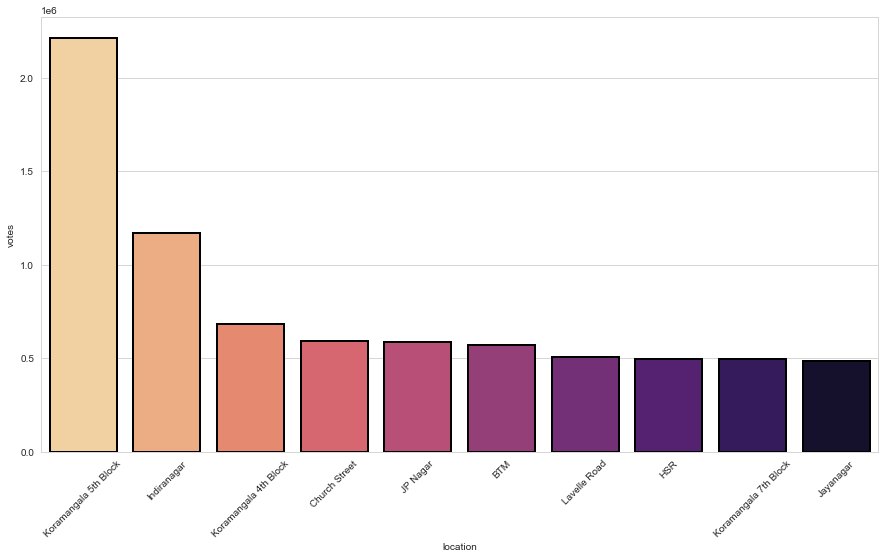

In [85]:
plt.figure(figsize=(15,8))              # Location Wise Highest Votes.
sns.barplot(Loc9.index ,Loc9['votes'],edgecolor='black',palette='magma_r',linewidth=2)
plt.xticks(rotation=45)

# 6) Data Visualization Based on Restaurant Type:

In [86]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


In [87]:
Rest1 = (d1['rest_type'].value_counts()/len(d1)*100).rename_axis('rest_type').reset_index(name='Counts').head(15)
Rest1

,rest_type,Counts
0,Quick Bites,37.237038
1,Casual Dining,20.084852
2,Cafe,7.208493
3,Delivery,5.040275
4,Dessert Parlor,4.389223
5,"Takeaway, Delivery",3.937593
6,Bakery,2.230781
7,"Casual Dining, Bar",2.221006
8,Beverage Shop,1.691171
9,Bar,1.341206


Text(0.5, 1.0, 'Differnt Types of Restaurant in Bangalore')

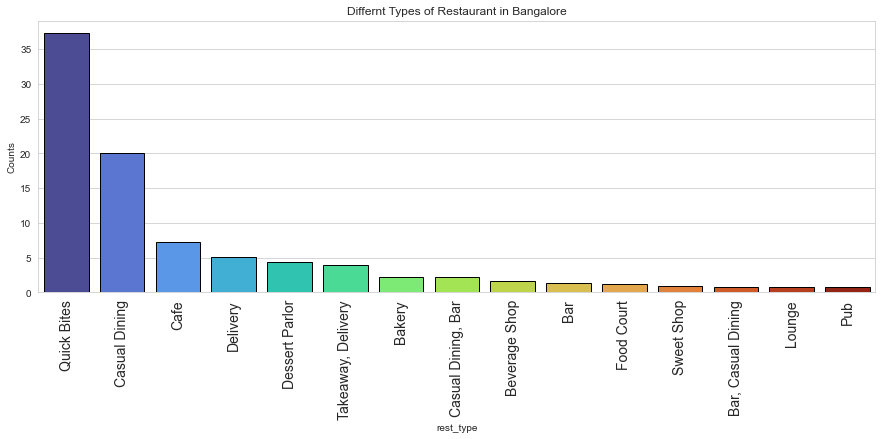

In [88]:
fig = plt.figure(figsize=(15,5))
plt.xticks(rotation=90,fontsize=14)
sns.set_style(style='whitegrid')            # Differnt Types of Restaurant in Bangalore.
sns.barplot(data=Rest1,x='rest_type',y='Counts',palette='turbo',edgecolor='black')
plt.title('Differnt Types of Restaurant in Bangalore')

### Restaurant Type List

In [89]:
d1['rest_type']

0              Casual Dining
1              Casual Dining
2        Cafe, Casual Dining
3                Quick Bites
4              Casual Dining
                ...         
51712                    Bar
51713                    Bar
51714                    Bar
51715                    Bar
51716     Bar, Casual Dining
Name: rest_type, Length: 51148, dtype: object

In [90]:
fig = px.histogram(x='rest_type',data_frame=d1)                   # ploting histogram.
fig.update_traces(marker_line_width=2,marker_line_color='black')

### Top 15 Best Rest Type in Bangalore

In [91]:
Rest2 = d1['rest_type'].value_counts().rename_axis('rest_type').reset_index(name='Counts').head(15)
Rest2

,rest_type,Counts
0,Quick Bites,19046
1,Casual Dining,10273
2,Cafe,3687
3,Delivery,2578
4,Dessert Parlor,2245
5,"Takeaway, Delivery",2014
6,Bakery,1141
7,"Casual Dining, Bar",1136
8,Beverage Shop,865
9,Bar,686


Text(0.5, 0, 'Number of Counts')

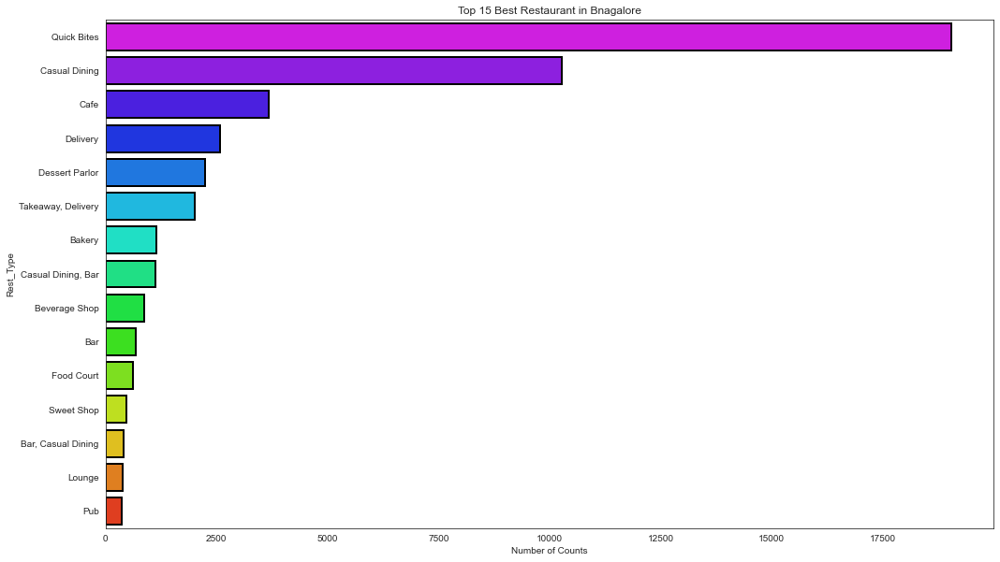

In [92]:
plt.figure(figsize= (17,10))                                # ploting Barplot.
sns.set_style(style='white')
Chains = d1['rest_type'].value_counts().head(15)
sns.barplot(x=Chains,y=Chains.index,palette='gist_rainbow_r',edgecolor='black',linewidth=2)
plt.xticks(fontsize=10)
plt.title('Top 15 Best Restaurant in Bnagalore')
plt.ylabel('Rest_Type')
plt.xlabel('Number of Counts')

##### As we all know, Banglore is Known as the tech Capital of India. so most of the modern people prefer Quick Bites,Casual Dining,Cafe and others Restaurants.

### Location Wise Highest & Lowest Rate

In [93]:
Rest4 = d1.groupby('rate')['rest_type'].unique().rename_axis('Rate').reset_index(name='Rest_Type Name')[0:50:5]
Rest4

,Rate,Rest_Type Name
0,1.8,[Casual Dining]
5,2.4,"[Delivery, Casual Dining, Quick Bites, Bakery,..."
10,2.9,"[Delivery, Dessert Parlor, Casual Dining, Quic..."
15,3.4,"[Quick Bites, Bakery, Dessert Parlor, Casual D..."
20,3.8,"[Cafe, Casual Dining, Casual Dining, Cafe, Caf..."
25,4.3,"[Dessert Parlor, Quick Bites, Casual Dining, K..."
30,4.8,"[Quick Bites, Casual Dining, Bar, Casual Dinin..."


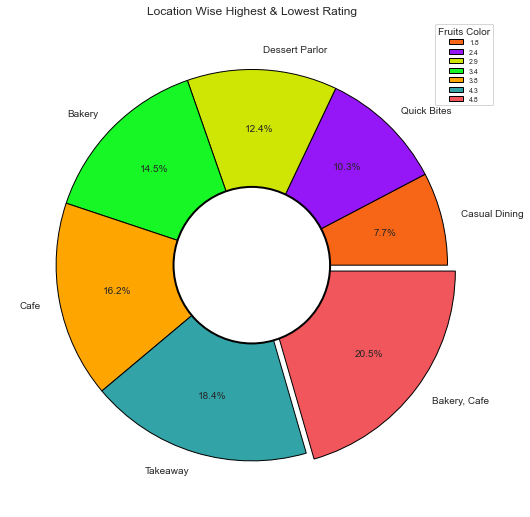

In [94]:
plt.figure(figsize= (9,9))                          # ploting Circle Pie Chart
plt.xticks(fontsize=45)
labels = ['Casual Dining','Quick Bites','Dessert Parlor','Bakery','Cafe','Takeaway','Bakery, Cafe']
sizes = [1.8,2.4,2.9,3.4,3.8,4.3,4.8]
colors = ['#f76516', '#9516f7', '#cfe605', '#16f725','#FFA500','#32a4a8','#f0565b']
explode = (0.0,0.0,0.0,0.0,0.0,0.0,0.05)
plt.pie(sizes, colors=colors,labels=labels,wedgeprops={'edgecolor':'k'},
        autopct='%1.1f%%', pctdistance=0.70,
        explode=explode)
centre_circle = plt.Circle((0, 0), 0.40, fc='white',edgecolor='black',linewidth=2)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Location Wise Highest & Lowest Rating')
plt.legend(sizes, loc="upper right", title="Fruits Color",fontsize=7)
plt.show()

# 7) Cuisines Wise Data Visualization

In [95]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


### Most Popular Cuisines in Bangalore

In [96]:
d1['cuisines'].value_counts()[:10]  

North Indian                           2858
North Indian, Chinese                  2355
South Indian                           1822
Biryani                                 906
Bakery, Desserts                        899
Fast Food                               798
Desserts                                760
Cafe                                    726
South Indian, North Indian, Chinese     724
Bakery                                  649
Name: cuisines, dtype: int64

C:\Users\Sabae\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0.5, 1.0, 'Most Popular Cuisines of Bangalore')

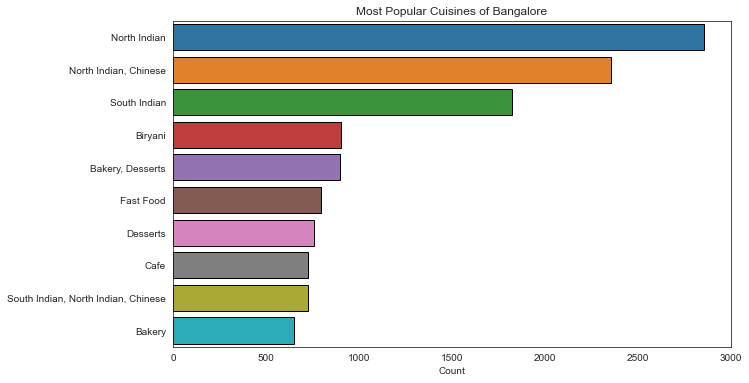

In [97]:
plt.figure(figsize= (10,6))                         # ploting Barplot.
plt.xticks(fontsize=10)
Cusin1 = d1['cuisines'].value_counts()[:10]
sns.barplot(Cusin1,Cusin1.index,edgecolor='black')
plt.xlabel('Count')
plt.title('Most Popular Cuisines of Bangalore')

##### We can observe that North Indian,South Indian and Biriyani are most common.


##### it means Bangalore is more influenced by North Indian Culture more than South.

### Cuisines Wise Restaurant

In [98]:
Cusin2 = d1.groupby('cuisines')['restaurant'].unique().rename_axis('cuisines').reset_index(name='Restaurant Name')
Cusin2

,cuisines,Restaurant Name
0,"African, Burger",[Galito's]
1,"African, Burger, Desserts, Beverages, Fast Food",[Galito's]
2,American,"[Quiznos, Uno Chicago Bar & Grill, Vimmi's Caf..."
3,"American, Asian, Continental, North Indian, So...",[Tapout Tavern]
4,"American, Asian, European, North Indian",[Monkey Bar]
...,...,...
2699,"Turkish, Fast Food, Biryani, Chinese",[Zu's Doner Kebaps]
2700,"Turkish, Rolls",[Tarbouche]
2701,Vietnamese,"[Vietnamese Kitchen, Hanoi - Vietnamese Cuisin..."
2702,"Vietnamese, Salad",[Phobidden Fruit]


##### In this given Restaurant You get all this Cuisines

### Cuisines Wise Highest Votes

In [99]:
Cusin3 = d1.groupby(['cuisines']).sum() 
Cusin4 = Cusin3.sort_values('votes',ascending=False)   # Cuisines Wise Highest Votes.
Cusin5 = Cusin4[['votes']].head(15)
Cusin5

,votes
cuisines,
North Indian,516346
"Pizza, Cafe, Italian",347520
"Cafe, American, Burger, Steak",301059
"North Indian, Chinese",258587
"North Indian, Mughlai, South Indian, Chinese",227930
South Indian,161983
"North Indian, Thai, Japanese, Continental, Cafe",161365
"North Indian, European, Mediterranean",136485
"North Indian, Continental, Chinese",122751


C:\Users\Sabae\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='cuisines', ylabel='votes'>

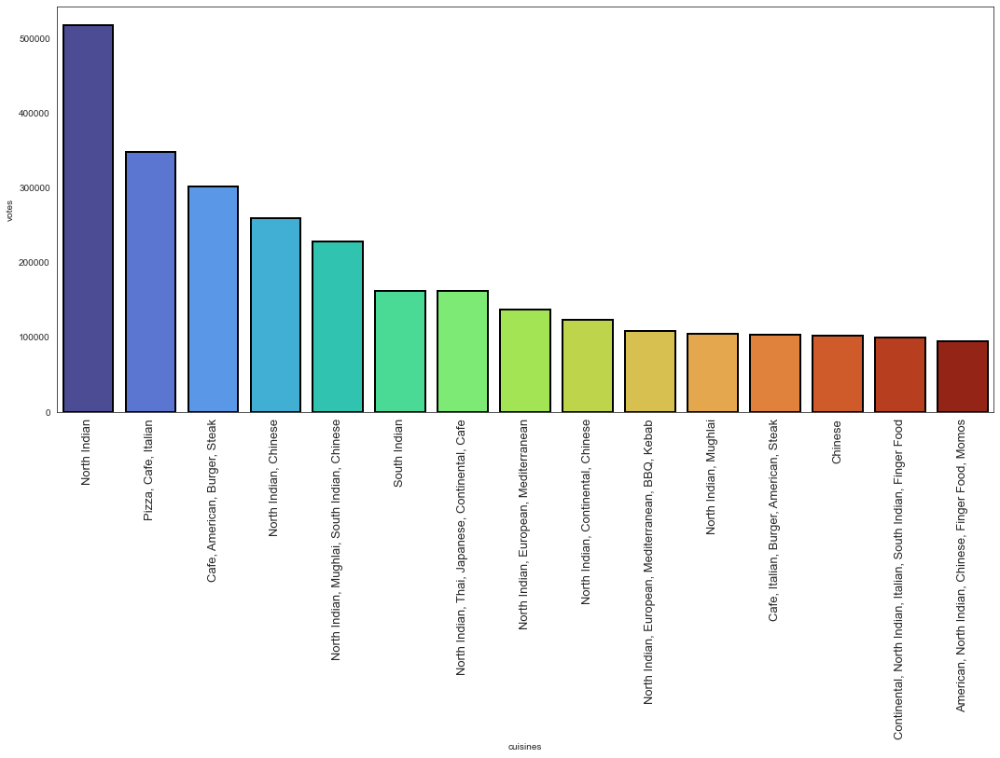

In [100]:
plt.figure(figsize=(18,8))             # Cuisines Wise Highest Votes.
plt.xticks(fontsize=13,rotation=90)
sns.barplot(Cusin5.index ,Cusin5['votes'],edgecolor='black',palette='turbo',linewidth=2)

### Which Cuisines Most Having Online Orders

In [101]:
Cusin6 = d1.groupby(['cuisines','online_order'])['online_order'].count()           # Cuisines Wise Data Extract.
Cusin6.to_csv('cuisines_online.csv')
Cusin6 = pd.read_csv('cuisines_online.csv')
Cusin6 = pd.pivot_table(Cusin6,values=None, index=['cuisines'],
                      columns=['online_order'], fill_value=0, aggfunc=np.sum)
Cusin6

online_order.1    
online_order                                                   No Yes
cuisines                                                             
African, Burger                                                 0  11
African, Burger, Desserts, Beverages, Fast Food                 0   2
American                                                        9   5
American, Asian, Continental, North Indian, Sou...              0  12
American, Asian, European, North Indian                         0   8
...                                                           ...  ..
Turkish, Fast Food, Biryani, Chinese                            1   0
Turkish, Rolls                                                  0  17
Vietnamese                                                      4  19
Vietnamese, Salad                                               2   0
Vietnamese, Thai, Burmese, Japanese                             0   4

[2704 rows x 2 columns]

In [102]:
Cuisines = ['Vietnamese','Turkish, Rolls','American, Asian, Continental, North Indian, South Indian, Chinese','African, Burger','American, Asian, European, North Indian','American','Vietnamese, Thai, Burmese, Japanese','African, Burger, Desserts, Beverages, Fast Food','Vietnamese, Salad','Turkish, Fast Food, Biryani, Chinese']
online_order = [19,17,12,11,8,5,4,2,0,0]

Text(0, 0.5, 'Online Order')

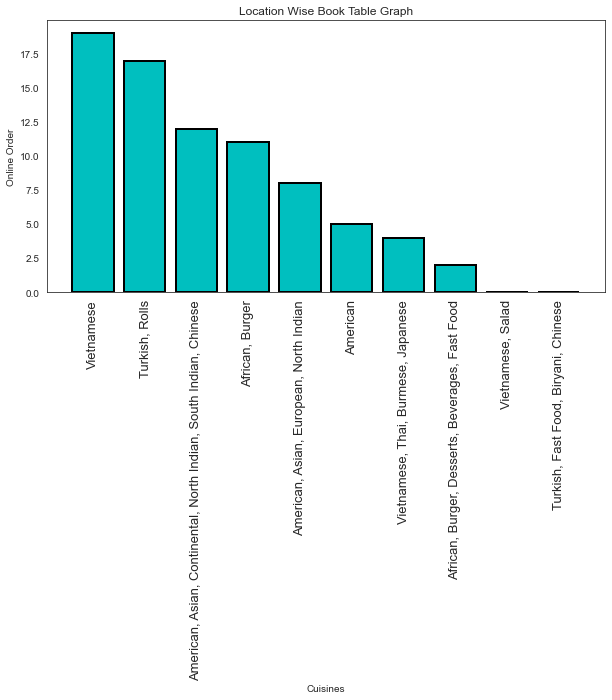

In [103]:
plt.figure(figsize= (10,5))                    # ploting Bar Graph.
plt.xticks(rotation=90,fontsize=13)
plt.title('Location Wise Book Table Graph')
plt.bar(Cuisines,online_order,color='c',edgecolor='black',linewidth=2)
plt.xlabel('Cuisines')
plt.ylabel('Online Order')

##### In This Above graph it Conclusion That most of the people can order this given Cuisines in Bangalore.

### Cuisines wise rating

In [104]:
Cusin7 = d1.groupby('rate')['cuisines'].unique().rename_axis('Rate').reset_index(name='Cuisines Name')[0:50:5]
Cusin7

,Rate,Cuisines Name
0,1.8,"[North Indian, Continental, Chinese]"
5,2.4,"[North Indian, North Indian, Chinese, Thai, Pi..."
10,2.9,"[Chinese, Continental, Italian, North Indian, ..."
15,3.4,"[Biryani, North Indian, Chinese, Fast Food, Ba..."
20,3.8,"[Cafe, Mexican, Italian, North Indian, Rajasth..."
25,4.3,"[Ice Cream, Desserts, North Indian, Street Foo..."
30,4.8,"[South Indian, North Indian, European, Mediter..."


In [105]:
Cuisines = ['North Indian, Continental, Chinese','North Indian, North Indian, Chinese, Thai','Chinese, Continental, Italian, North Indian','Biryani, North Indian, Chinese, Fast Food','Cafe, Mexican, Italian, North Indian, Rajasth','Ice Cream, Desserts, North Indian, Street Food','South Indian, North Indian, European, Mediter']
Rate = [1.8,2.4,2.9,3.4,3.8,4.3,4.8]

Text(0, 0.5, 'Online Order')

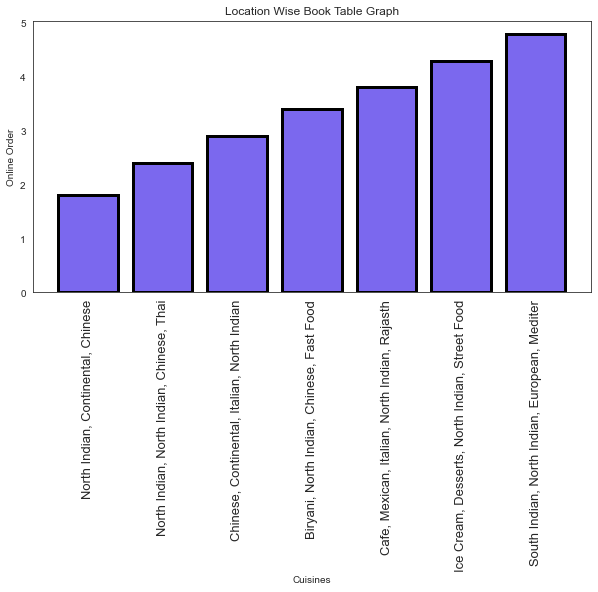

In [106]:
plt.figure(figsize= (10,5))                             # ploting Bar Graph.
plt.xticks(rotation=90,fontsize=13)
plt.title('Location Wise Book Table Graph')
plt.bar(Cuisines,Rate,color='#7B68EE',edgecolor='black',linewidth=3)
plt.xlabel('Cuisines')
plt.ylabel('Online Order')

# 8) Approx Cost Wise Data Visualization

In [107]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


### Finding Best Restaurant

In [108]:
d1['cost_two_plates'].value_counts()

300.0     7549
400.0     6517
500.0     4937
200.0     4844
600.0     3691
          ... 
60.0         1
5000.0       1
3700.0       1
469.0        1
160.0        1
Name: cost_two_plates, Length: 70, dtype: int64

In [109]:
fig = px.histogram(x='cost_two_plates',data_frame=d1)                 # ploting histogram.
fig.update_traces(marker_line_width=2,marker_line_color='black')

##### Most of the price between in a range of under 1000.

##### It means most are affortable & very few are luxurious.

### Findiing Approx Cost for One People

In [110]:
d1['cost_two_plates']/2

0         400.0
1         400.0
2         400.0
3         150.0
4         300.0
          ...  
51712     750.0
51713     300.0
51714    1000.0
51715    1250.0
51716     750.0
Name: cost_two_plates, Length: 51148, dtype: float64

### Top 10 Most Expensive Restaurant with approx of cost of 2 people

In [111]:
d1['cost_two_plates'].nlargest(10)

19139    6000.0
45618    6000.0
40266    5000.0
41591    4500.0
42141    4500.0
37715    4100.0
39125    4100.0
39416    4100.0
40262    4100.0
6104     4000.0
Name: cost_two_plates, dtype: float64

Text(0.5, 1.0, 'Top 10 Smallest Restaurant for Cost Two People')

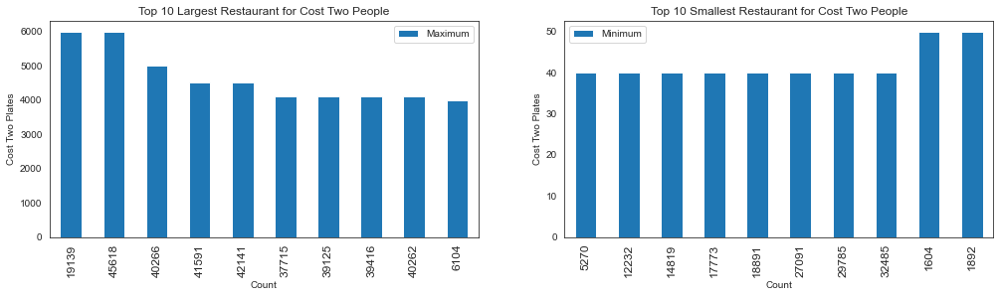

In [112]:
fig = plt.figure(figsize=(17,4))                  # ploting Subplot.
plt.subplot(1,2,1)
d1['cost_two_plates'].nlargest(10).plot.bar()
plt.xlabel('Count')
plt.ylabel('Cost Two Plates')
plt.legend(['Maximum'])
plt.xticks(fontsize=12)
plt.title('Top 10 Largest Restaurant for Cost Two People')
plt.subplot(1,2,2)
d1['cost_two_plates'].nsmallest(10).plot.bar()
plt.xlabel('Count')
plt.ylabel('Cost Two Plates')
plt.legend(['Minimum'])
plt.xticks(fontsize=12)
plt.title('Top 10 Smallest Restaurant for Cost Two People')

### Top 10 Most Cheapest Restaurant with approx of cost of 2 people

In [113]:
d1['cost_two_plates'].nsmallest(10)

5270     40.0
12232    40.0
14819    40.0
17773    40.0
18891    40.0
27091    40.0
29785    40.0
32485    40.0
1604     50.0
1892     50.0
Name: cost_two_plates, dtype: float64

### Cosst Two Plates Wise Data

In [114]:
Cost1 = d1[d1['cost_two_plates'] <= 500].loc[:,('cost_two_plates')]
Cost2 = Cost1.reset_index()
Cost2.head()

,index,cost_two_plates
0,3,300.0
1,10,500.0
2,12,500.0
3,13,450.0
4,18,300.0


In [115]:
Cost4 = go.Bar(x=Cost2['cost_two_plates'].value_counts().index,           # ploting Bar graph.
                y=Cost2['cost_two_plates'].value_counts())
iplot([Cost4])

##### We can conclusion that 300 and 400 cost dishes are maximum in count

# 9) Review List Wise Data Visualization

In [116]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


### Cleaning Review Column

In [117]:
d1['reviews_list'][0]                         # Cleaning Review Column With The Help of Regex.
data = d1['reviews_list'][0].lower()
data2 = re.sub('[^a-zA-Z]',' ',data)
data3 = re.sub('rated',' ',data2)
data4 = re.sub('x',' ',data3)
re.sub(' +',' ',data4)

' n a beautiful place to dine in the interiors take you back to the mughal era the lightings are just perfect we went there on the occasion of christmas and so they had only limited items available but the taste and service was not compromised at all the only complaint is that the breads could have been better would surely like to come here again n i was here for dinner with my family on a weekday the restaurant was completely empty ambience is good with some good old hindi music seating arrangement are good too we ordered masala papad panner and baby corn starters lemon and corrionder soup butter roti olive and chilli paratha food was fresh and good service is good too good for family hangout ncheers n its a restaurant near to banashankari bda me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet on inquiring they said this place is mostly visited by vegetarians anyways we ordered ala carte items which took ages to come food was o

In [118]:
d1['rest_type'].unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Beverage Shop, Quick Bites', 'Confectionery',
       'Quick Bites, Beverage Shop', 'Dessert Parlor, Sweet Shop',
       'Bakery, Quick Bites', 'Sweet Shop, Quick Bites', 'Kiosk',
       'Food Truck', 'Quick Bites, Dessert Parlor',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Dessert Parlor, Quick Bites',
       'Microbrewery, Casual Dining', 'Lounge', 'Bar, Casual Dining',
       'Food Court', 'Cafe, Bakery', 'Dhaba', 'Quick Bites, Sweet Shop',
       'Microbrewery', 'Food Court, Quick Bites', 'Pub, Bar',
       'Casual Dining, Pub', 'Lounge, Ba

In [119]:
stopwords = set(STOPWORDS)

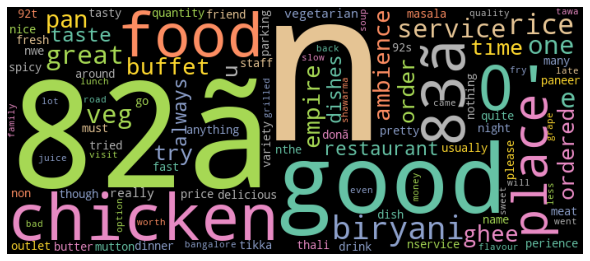

In [120]:
Review1 = d1[d1['rest_type'] == 'Casual Dining'].head(10)           # Creating WordCloud.

total_review = ''

# Converts each token into lowercase
for review in Review1['reviews_list']:
    review = review.lower()
    review = re.sub('^a-zA-z',' ',review)
    review = re.sub('rated',' ',review)
    review = re.sub('x',' ',review)
    review = re.sub(' +',' ',review)
    
    # typecaste each val to string
    total_review = total_review + str(review)
    
    
wordcloud = WordCloud(width = 700, height = 300,random_state=123,
                 background_color = 'black',colormap='Set2',collocations=False,
                     stopwords = stopwords,
                     min_font_size = 10).generate(total_review)

# plot the WordCloud image  
plt.figure(figsize= (8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad = 0)

plt.show()

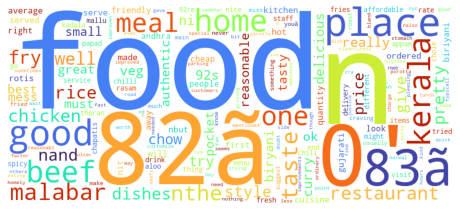

In [121]:
Review1 = d1[d1['rest_type'] == 'Mess'].head(10)                            # Creating WordCloud.

total_review = ''

# Converts each token into lowercase
for review in Review1['reviews_list']:
    review = review.lower()
    review = re.sub('^a-zA-z',' ',review)
    review = re.sub('rated',' ',review)
    review = re.sub('x',' ',review)
    review = re.sub(' +',' ',review)
    
    # typecaste each val to string
    total_review = total_review + str(review)
    
    
wordcloud = WordCloud(width = 900, height = 400,random_state=123,
                 background_color = 'white',colormap='turbo',collocations=False,
                     stopwords = stopwords,
                     min_font_size = 10).generate(total_review)

# plot the WordCloud image  
plt.figure(figsize= (8,8))
plt.imshow(wordcloud)
plt.axis('off')
# plt.tight_layout(pad = 0)

plt.show()

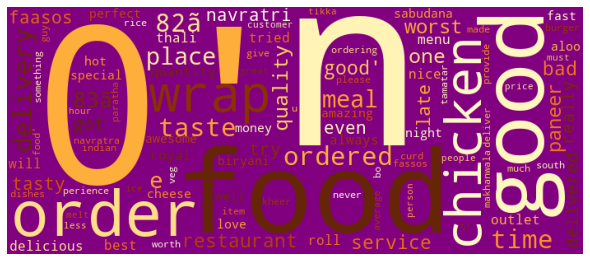

In [122]:
Review1 = d1[d1['rest_type'] == 'Quick Bites'].head(10)                 # Creating WordCloud.

total_review = ''

# Converts each token into lowercase
for review in Review1['reviews_list']:
    review = review.lower()
    review = re.sub('^a-zA-z',' ',review)
    review = re.sub('rated',' ',review)
    review = re.sub('x',' ',review)
    review = re.sub(' +',' ',review)
    
    # typecaste each val to string
    total_review = total_review + str(review)
    
wordcloud = WordCloud(width = 700, height = 300,random_state=123,
                 background_color = 'purple',colormap='YlOrBr_r',collocations=False,
                     stopwords = stopwords,
                     min_font_size = 10).generate(total_review)

# plot the WordCloud image  
plt.figure(figsize= (8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad = 0)

plt.show()

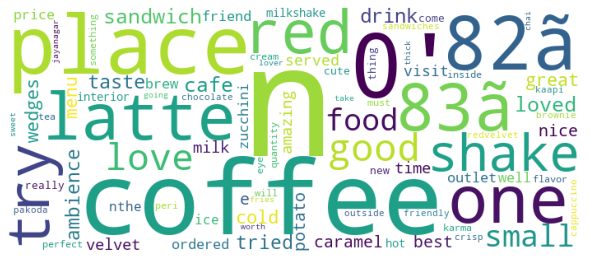

In [123]:
from PIL import Image
Review1 = d1[d1['rest_type'] == 'Beverage Shop'].head(10)             # Creating WordCloud.

total_review = ''

# Converts each token into lowercase
for review in Review1['reviews_list']:
    review = review.lower()
    review = re.sub('^a-zA-z',' ',review)
    review = re.sub('rated',' ',review)
    review = re.sub('x',' ',review)
    review = re.sub(' +',' ',review)
    
    # typecaste each val to string
    total_review = total_review + str(review)
    
wordcloud = WordCloud(width = 700, height = 300,random_state=123,
                 background_color ='white',collocations=False,
                     stopwords = stopwords,
                     min_font_size = 10).generate(total_review)

# plot the WordCloud image  
plt.figure(figsize= (8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad = 0)

plt.show()

# 10) Dish Like Wise Data Visualization

In [124]:
Original_data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [125]:
Original_data = Original_data.drop(['address','phone','listed_in(city)','menu_item'], axis=1)

Original_data.drop_duplicates(inplace= True)



def Cleaning_rate(cl_rate):               # Creating Function to Clean Rate Column.
    if(cl_rate == 'NEW' or cl_rate == '-'):               # Removing 'NEW','-' & '/5'
        return np.nan
    else:
        return float(str(cl_rate).split('/')[0])
        
Original_data['rate'] = Original_data['rate'].apply(Cleaning_rate)



Original_data['rate'].fillna(d1['rate'].mean(), inplace= True)   # Filing Null Values.

Original_data.dropna(inplace= True)

Original_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23435 entries, 0 to 51715
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   url                          23435 non-null  object 
 1   name                         23435 non-null  object 
 2   online_order                 23435 non-null  object 
 3   book_table                   23435 non-null  object 
 4   rate                         23435 non-null  float64
 5   votes                        23435 non-null  int64  
 6   location                     23435 non-null  object 
 7   rest_type                    23435 non-null  object 
 8   dish_liked                   23435 non-null  object 
 9   cuisines                     23435 non-null  object 
 10  approx_cost(for two people)  23435 non-null  object 
 11  reviews_list                 23435 non-null  object 
 12  listed_in(type)              23435 non-null  object 
dtypes: float64(1), i

(-0.5, 2047.5, 2047.5, -0.5)

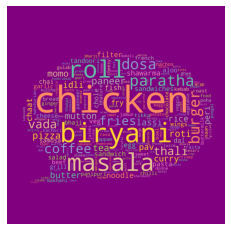

In [126]:
Rest = Original_data['rest_type'].value_counts()[:9].index

Data = Original_data[Original_data['rest_type'] == 'Quick Bites']

stopwords = set(STOPWORDS)



dishes = ''
for word in Data['dish_liked']:
    words = word.split()
    for i in range(len(words)):         # Converting each token into uppercase.
        words[i] = words[i].lower()
    dishes = dishes + " ".join(words)+" "
    
    
mask = np.array(Image.open('Comment.png'))

wordcloud = WordCloud(width = 700, height = 300,random_state=123,
                 background_color = 'purple',colormap='Set2',collocations=False,mask=mask,
                     stopwords = stopwords,
                     min_font_size = 10).generate(dishes)



plt.imshow(wordcloud)
plt.axis("off")

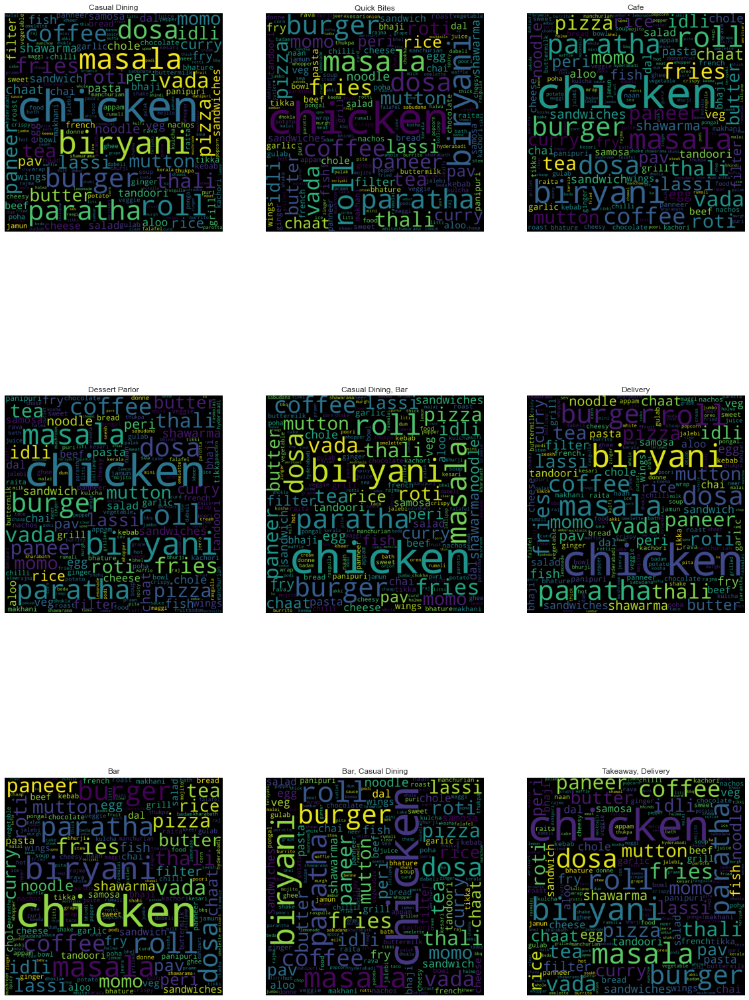

In [170]:
Rest = Original_data['rest_type'].value_counts()[:9].index

Data = Original_data[Original_data['rest_type'] == 'Quick Bites']

stopwords = set(STOPWORDS)


def produce_wordcloud(rest):
    
    plt.figure(figsize= (20,30))
    for i,restaurant in enumerate(Rest):
        plt.subplot(3,3,i+1)
        dishes = ''
        data = Original_data[Original_data['rest_type'] == restaurant]
        for word in Data['dish_liked']:
            words = word.split()
            for i in range(len(words)):
                words[i] = words[i].lower()
            dishes = dishes + " ".join(words) + " "
        wordcloud = WordCloud(max_font_size=None,background_color='black', collocations=False,
                      stopwords = stopwords,width=1500, height=1500).generate(dishes)
        plt.imshow(wordcloud)
        plt.title(restaurant)
        plt.axis("off")
                
                
                
        
stopwords = set(STOPWORDS)
produce_wordcloud(Rest)

# 11) Type Wise Data Visualization

In [128]:
d1.head()

,url,restaurant,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_two_plates,reviews_list,type
0,https://www.zomato.com/bangalore/jalsa-banasha...,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet
1,https://www.zomato.com/bangalore/spice-elephan...,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet
2,https://www.zomato.com/SanchurroBangalore?cont...,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet
3,https://www.zomato.com/bangalore/addhuri-udupi...,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet
4,https://www.zomato.com/bangalore/grand-village...,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet


In [129]:
d1['type'].unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

### Most Famous Type Where Coustomer Visit More

In [130]:
Type1 = d1['type'].value_counts().rename_axis('Type').reset_index(name='Counts')
Type1

,Type,Counts
0,Delivery,25653
1,Dine-out,17583
2,Desserts,3559
3,Cafes,1703
4,Drinks & nightlife,1091
5,Buffet,871
6,Pubs and bars,688


Text(0.5, 1.0, 'Most Famous Restaurant Where Customer Visit Most')

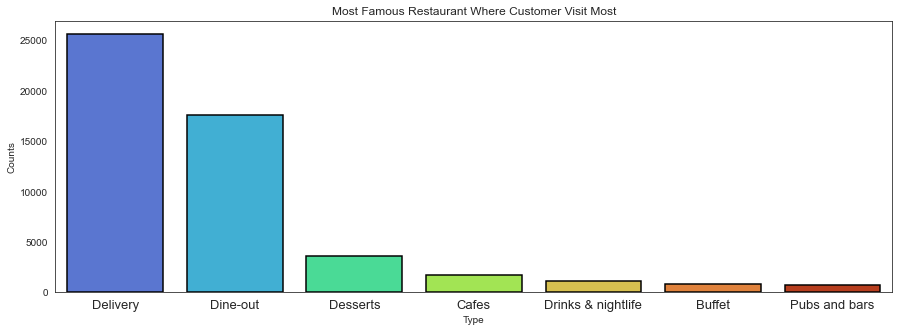

In [131]:
fig = plt.figure(figsize=(15,5))                     # ploting Barplot.
plt.xticks(fontsize=13)
sns.set_style(style='whitegrid')
sns.barplot(data=Type1,x='Type',y='Counts',palette='turbo',edgecolor='black',linewidth=1.5)
plt.title('Most Famous Restaurant Where Customer Visit Most')

# Finding Rate of Type 

In [132]:
Type2 = d1.groupby('rate')['type'].unique().rename_axis('Rate').reset_index(name='Type Name')[0:50:5]
Type2

,Rate,Type Name
0,1.8,[Dine-out]
5,2.4,"[Delivery, Dine-out, Desserts, Cafes, Drinks &..."
10,2.9,"[Delivery, Desserts, Dine-out, Cafes, Buffet, ..."
15,3.4,"[Delivery, Desserts, Dine-out, Cafes, Drinks &..."
20,3.8,"[Buffet, Cafes, Delivery, Desserts, Dine-out, ..."
25,4.3,"[Delivery, Desserts, Dine-out, Buffet, Cafes, ..."
30,4.8,"[Dine-out, Buffet, Pubs and bars, Delivery, Dr..."


In [133]:
Type = ['Buffet','Cafes','Delivery','Desserts','Dine-out','Drinks & nightlife','Pubs and bars']
Rating = [1.8,2.4,2.9,3.4,3.8,4.3,4.8]

Text(0, 0.5, 'Type Name')

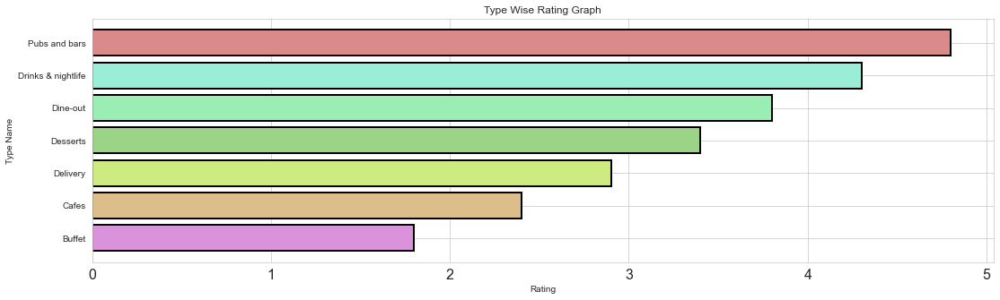

In [134]:
plt.figure(figsize= (18,5))                        # ploting Barh graph.
plt.xticks(rotation=0,fontsize=16)
plt.title('Type Wise Rating Graph')
plt.barh(Type,Rating,edgecolor='black',linewidth=2,color=['#da93db', '#dbbe8a', '#ceeb81', '#9cd487', '#9aedb3','#9aedd7','#db8a8a'])
plt.xlabel('Rating')
plt.ylabel('Type Name')

# Cheapest V/S Expensive Type in Bangalore

In [135]:
Type3 = d1.groupby('cost_two_plates')['type'].unique().rename_axis('cost_two_plates').reset_index(name='Type Name')
Type3

,cost_two_plates,Type Name
0,40.0,"[Delivery, Dine-out]"
1,50.0,"[Delivery, Desserts, Cafes]"
2,60.0,[Delivery]
3,70.0,[Dine-out]
4,80.0,"[Dine-out, Delivery, Desserts]"
...,...,...
65,4000.0,"[Dine-out, Pubs and bars, Drinks & nightlife]"
66,4100.0,"[Buffet, Dine-out]"
67,4500.0,"[Dine-out, Drinks & nightlife]"
68,5000.0,[Dine-out]


In [136]:
d1['type'].unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

In [137]:
Type_Name = ['Dine-out, Delivery, Desserts','Dine-out','Delivery','Delivery, Dine-out','Delivery, Drinks']

cost_two_plates = [80,70,60,50,40]

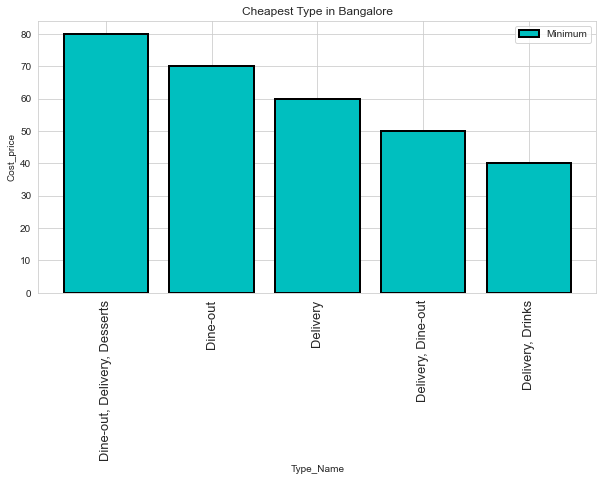

In [138]:
plt.figure(figsize= (10,5))                                  # ploting bar graph.
plt.xticks(rotation=90,fontsize=13)
plt.title('Cheapest Type in Bangalore')
plt.bar(Type_Name,cost_two_plates,color='c',edgecolor='black',linewidth=2)
plt.xlabel('Type_Name')
plt.ylabel('Cost_price')
plt.legend(['Minimum'])

In [139]:
TYPE_NAME = ['Dine-out, Pubs and bars, Drinks & nightlife','Buffet, Dine-out','Dine-out, Drinks & nightlife','Dine-out','Pubs and bars']

COST_TWO_PLATES = [4000,4100,4500,5000,6000]

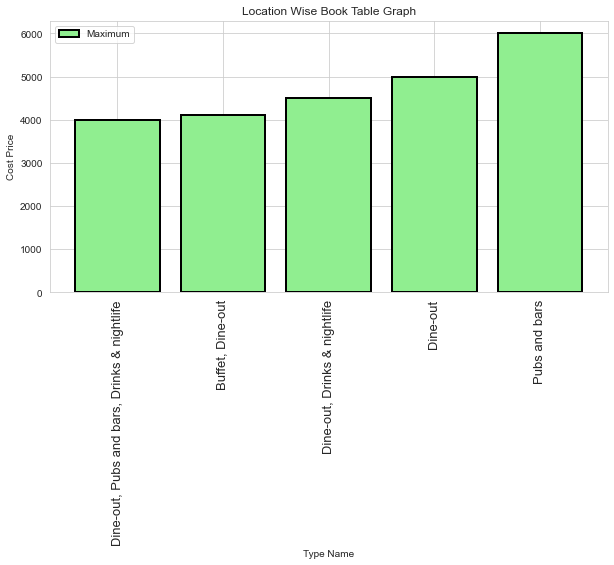

In [140]:
plt.figure(figsize= (10,5))                                  # ploting bar graph.
plt.xticks(rotation=90,fontsize=13)
plt.title('Location Wise Book Table Graph')
plt.bar(TYPE_NAME,COST_TWO_PLATES,color='lightgreen',edgecolor='black',linewidth=2)
plt.xlabel('Type Name')
plt.ylabel('Cost Price')
plt.legend(['Maximum'])

# Type Wise Location Data

In [141]:
Type4 = d1.groupby('location')['type'].unique().rename_axis('Location').reset_index(name='Type Name')
Type4

,Location,Type Name
0,BTM,"[Buffet, Cafes, Delivery, Desserts, Dine-out, ..."
1,Banashankari,"[Buffet, Cafes, Delivery, Desserts, Dine-out, ..."
2,Banaswadi,"[Cafes, Delivery, Desserts, Dine-out, Drinks &..."
3,Bannerghatta Road,"[Buffet, Cafes, Delivery, Desserts, Dine-out, ..."
4,Basavanagudi,"[Buffet, Cafes, Delivery, Desserts, Dine-out, ..."
...,...,...
88,West Bangalore,"[Delivery, Dine-out]"
89,Whitefield,"[Cafes, Delivery, Buffet, Desserts, Dine-out, ..."
90,Wilson Garden,"[Buffet, Delivery, Desserts, Dine-out, Cafes, ..."
91,Yelahanka,"[Delivery, Dine-out]"
